<center><h1>Trafiklab data test</h1></center>
<center><h3>Trivector Traffik Delivery - Data Analytics</h3></center>


# Pre-objectives

* Understanding of data format
* How to obtain/download data
* Data Visualization
* What to do with data
* Write script examples to build the code

#### Level of task: 

#### Duration: 

#### Import necessary libraries

In [49]:
import requests
from google.transit import gtfs_realtime_pb2
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx
import matplotlib.pyplot as plt
import folium
import pandas as pd
from shapely.geometry import LineString
from shapely.ops import unary_union 
from pyproj import CRS
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import re
import networkx as nx
import osmnx as ox
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon
ox.config(log_console=True, use_cache=True)
ox.__version__
from matplotlib.patches import Polygon
from shapely.geometry import Polygon as ShapelyPolygon, MultiPolygon
import numpy as np 
from scipy.spatial.distance import euclidean

C:\Users\ilts\AppData\Local\Temp\ipykernel_26744\4052512936.py:19: FutureWarning: The `utils.config` function is deprecated and will be removed in the v2.0.0 release. Instead, use the `settings` module directly to configure a global setting's value. For example, `ox.settings.log_console=True`. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  ox.config(log_console=True, use_cache=True)


#### Obtaining data through API key 

In [235]:
# Your API key and the request URL
apikey = '545119bf80e4437c874f1f185b1fcf8e'
operator = 'skane'  # Example operator code
url = f'https://opendata.samtrafiken.se/gtfs-rt/{operator}/VehiclePositions.pb?key={apikey}'

# Make the request and parse the GTFS-RT data
response = requests.get(url)
# Check the status code of the response
if response.status_code == 200:
    print("Success! Data has been accessed.")
else:
    print(f"Failed to access data. Status code: {response.status_code}")
    print("Response content:", response.text)  # This will show the error message from the API, if any

Success! Data has been accessed.


#### Parsing data

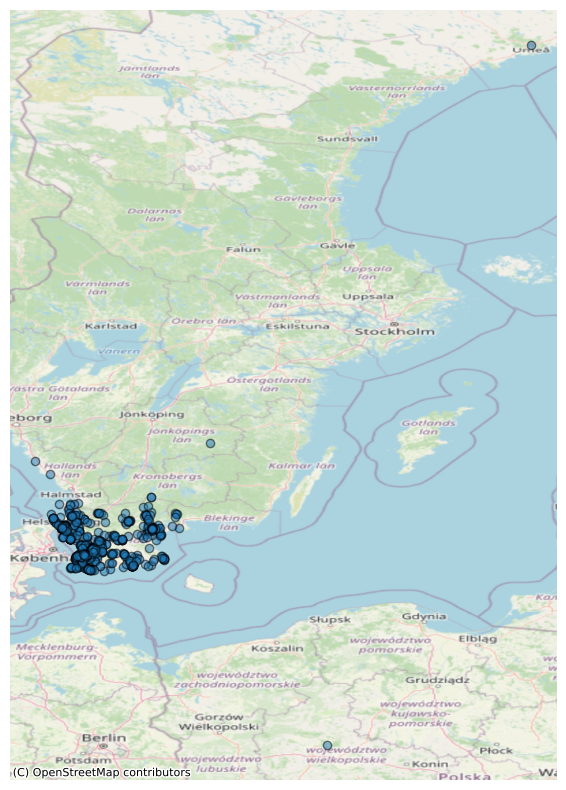

In [236]:
data = response.content
feed = gtfs_realtime_pb2.FeedMessage()
feed.ParseFromString(data)

# Extract vehicle positions and convert to GeoDataFrame
vehicle_positions = [{'latitude': entity.vehicle.position.latitude, 'longitude': entity.vehicle.position.longitude} for entity in feed.entity if entity.HasField('vehicle')]
gdf = gpd.GeoDataFrame(vehicle_positions, geometry=[Point(pos['longitude'], pos['latitude']) for pos in vehicle_positions])

# Plotting on OpenStreetMap
ax = gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off()
plt.show()

#### Extracting static data

In [237]:
# Your API key and the request URL
apikey = '2ac0a1c40be543fa82f6a83df05d1ceb'
operator = 'skane'  # Example operator code
url = f'https://opendata.samtrafiken.se/gtfs/{operator}/{operator}.zip?key={apikey}'

# Make the request and parse the GTFS-RT data
response = requests.get(url)
# Check the status code of the response
if response.status_code == 200:
    print("Success! Data has been accessed.")
else:
    print(f"Failed to access data. Status code: {response.status_code}")
    print("Response content:", response.text)  # This will show the error message from the API, if any

Failed to access data. Status code: 429
Response content: {"errorMessage":"Key \"2ac0a1c40be543fa82f6a83df05d1ceb\" has exceeded its quota"}


#### Prompt

In [18]:
# 1. Importera nödvändiga bibliotek (pandas).
# 2. Läs CSV-filen som innehåller resadata till en pandas DataFrame med hjälp av pd.read_csv().
# 3. Ladda data från '___'-filen till en annan DataFrame som heter '____'.
# 4. Analysera filen '____.txt' och lagra dess innehåll i en DataFrame som heter '____'.
# 5. Använd 's____'-filen för att skapa en DataFrame som heter 'stops' som innehåller information om transitstopp.
# 6. Utforska de laddade dataramarna för att förstå deras struktur och innehåll.
# 7. Kontrollera de första raderna i varje DataFrame med .head()-metoden för att säkerställa dataintegritet.
# 8. Granska datatyperna och kolumnnamnen för varje DataFrame med .info() för ytterligare analys.

In [2]:
# Read trips.txt from the specified file path
trips = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\Skane\trips.txt')

# Load shapes.txt data into a DataFrame named 'shapes'
shapes = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\Skane\shapes.txt')

stop_times = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\Skane\stop_times.txt')

stops = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\Skane\stops.txt')

routes = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\Skane\routes.txt')

#### Understanding routes

In [20]:
routes.head()

,route_id,agency_id,route_short_name,route_long_name,route_type,route_desc
0,9011012000100000,121120000000001001,1,Elinegård - Jägersro - Kristineberg,700,Stadsbuss Malmö
1,9011012000200000,121120000000001001,2,Kastanjegården - Malmö C,700,Stadsbuss Malmö
2,9011012000300000,121120000000001001,3,Ringlinjen,700,Stadsbuss Malmö
3,9011012000400000,121120000000001001,4,Bunkeflostrand - Limhamn - Segevång - Bernstorp,700,Stadsbuss Malmö
4,9011012000500000,121120000000001001,5,MalmöExpressen Västra Hamnen - Stenkällan,700,Stadsbuss Malmö


### Understanding shapes

In [21]:
shapes.head()

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence,shape_dist_traveled
0,1121120000321676447,55.564086,12.944482,1,0.00
1,1121120000321676447,55.564101,12.944370,2,0.01
2,1121120000321676447,55.564374,12.944524,3,32.02
3,1121120000321676447,55.564466,12.944581,4,43.33
4,1121120000321676447,55.564475,12.944596,5,44.33


### Understanding trips

In [22]:
trips.head()

,route_id,service_id,trip_id,trip_headsign,direction_id,shape_id
0,9011012000100000,1,121120000347447090,NaN,1,1121120000321676447
1,9011012000100000,1,121120000347447188,NaN,1,1121120000321676447
2,9011012000100000,1,121120000347448351,NaN,1,1121120000321676447
3,9011012000100000,1,121120000347448743,NaN,1,1121120000321676447
4,9011012000100000,1,121120000347448890,NaN,1,1121120000321676447


In [23]:
trips.dtypes

route_id          object
service_id         int64
trip_id            int64
trip_headsign    float64
direction_id       int64
shape_id           int64
dtype: object

In [24]:
filtered_trips = trips[trips['route_id'] == '9011012000100000']
filtered_trips.head()


,route_id,service_id,trip_id,trip_headsign,direction_id,shape_id
0,9011012000100000,1,121120000347447090,NaN,1,1121120000321676447
1,9011012000100000,1,121120000347447188,NaN,1,1121120000321676447
2,9011012000100000,1,121120000347448351,NaN,1,1121120000321676447
3,9011012000100000,1,121120000347448743,NaN,1,1121120000321676447
4,9011012000100000,1,121120000347448890,NaN,1,1121120000321676447


In [25]:
# Unique directions
unique_direction_ids = trips['direction_id'].unique()
print(unique_direction_ids)

[1 0]


In [26]:
# Count occurrences of each unique trip_id
trip_id_counts = trips['trip_id'].value_counts()

# Check if there are any duplicate trip_id values
duplicate_trip_ids = trip_id_counts[trip_id_counts > 1]

if len(duplicate_trip_ids) == 0:
    print("There are no duplicate trip_id values.")
else:
    print("Duplicate trip_id values found.")
    print("Number of occurrences per trip_id:")
    print(duplicate_trip_ids)

There are no duplicate trip_id values.


In [27]:
# Unique service id
unique_service_ids = trips['service_id'].unique()
print(unique_service_ids)

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 240 241 242 243 244 245 246 24

In [28]:
# Count occurrences of each unique service_id
service_id_counts = trips['service_id'].value_counts()

# Check if there are any duplicate trip_id values
duplicate_service_ids = service_id_counts[service_id_counts > 1]

if len(duplicate_service_ids) == 0:
    print("There are no duplicate service_id values.")
else:
    print("Duplicate service_id values found.")
    print("Number of occurrences per service_id:")
    print(duplicate_service_ids )

Duplicate service_id values found.
Number of occurrences per service_id:
service_id
1      12126
3       4148
2       2284
4       2169
13      1022
       ...  
42         2
337        2
217        2
102        2
218        2
Name: count, Length: 242, dtype: int64


#### How many trips per each unique route and service 

In [29]:
# Filter the dataset for the specific combination of route_id and service_id
filtered_trips = trips[(trips['route_id'] == '9011012000100000') & (trips['service_id'] == 1)]

# Count the number of trip_id values
num_trip_ids = filtered_trips['trip_id'].count()

# Print the result
print("Number of trip_id values for route_id 9011012000100000 and service_id 1:", num_trip_ids)


Number of trip_id values for route_id 9011012000100000 and service_id 1: 201


In [30]:
# Get the unique service_id values
unique_service_ids = filtered_trips['service_id'].unique()

# Print the unique service_id values
print(unique_service_ids)

[1]


### Understanding stop_times

In [31]:
stop_times.head()

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
0,121120000347447090,04:57:00,04:57:00,9022012080081002,1,Kristineberg via Gustav Adolfs torg,3,1,0.00,1
1,121120000347447090,04:57:52,04:57:52,9022012080079002,2,Kristineberg via Gustav Adolfs torg,3,3,446.68,0
2,121120000347447090,04:59:15,04:59:15,9022012080073002,3,Kristineberg via Gustav Adolfs torg,3,3,1070.34,0
3,121120000347447090,05:00:05,05:00:05,9022012080348002,4,Kristineberg via Gustav Adolfs torg,3,3,1429.88,0
4,121120000347447090,05:00:32,05:00:32,9022012080347002,5,Kristineberg via Gustav Adolfs torg,3,3,1610.70,0


### Understanding stops

In [32]:
stops.head()

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code
0,9021012002503000,Laholm Repslagargatan,56.511082,13.052599,1,NaN,NaN
1,9021012002505000,Laholm Glänninge vårdcentral,56.504204,13.051977,1,NaN,NaN
2,9021012002507000,Laholm Altona,56.503528,13.046210,1,NaN,NaN
3,9021012002518000,Laholm Kristianstadsvägen,56.507425,13.058259,1,NaN,NaN
4,9021012003400000,Halmstad Resecentrum,56.669207,12.865548,1,NaN,NaN


## Understanding dataset

In [33]:
# 1. Konvertera '___' DataFrame till en GeoDataFrame med 'gpd.GeoDataFrame()'.
# 2. Använd parametern '___' för att specificera geometrikolumnen som punkter skapade från latitud- och longitudkoordinater.
# 3. Ställ in koordinatreferenssystemet (CRS) för GeoDataFrame till EPSG:4326, förutsatt att WGS84 koordinatsystem.
# 4. Läs '___'-filen från den angivna sökvägen till en pandas DataFrame med 'pd.read_csv()'.
# 5. Konvertera stoppkoordinaterna till punktgeometrier med hjälp av en listförståelse och 'Point()'-funktionen från 'shapely.geometry'.
# 6. Skapa en ny GeoDataFrame med namnet '___' med stoppdata och geometrier.
# 7. Ställ in koordinatreferenssystemet (CRS) för '___' GeoDataFrame till EPSG:4326, förutsatt att WGS84 koordinatsystem.

## Visualising

In [239]:
# Convert shapes data to GeoDataFrame
gdf_shapes = gpd.GeoDataFrame(shapes, geometry=gpd.points_from_xy(shapes['shape_pt_lon'], shapes['shape_pt_lat']))

# Set CRS for GeoDataFrame
gdf_shapes.crs = "EPSG:4326"  # Assuming the data is in WGS84 coordinate system

# Read stops.txt from the specified file path
stops = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\Skane\stops.txt')

# Convert stop coordinates to Points
stop_points = [Point(lon, lat) for lat, lon in zip(stops['stop_lat'], stops['stop_lon'])]

# Convert to GeoDataFrame
gdf_stops = gpd.GeoDataFrame(stops, geometry=stop_points)

# Set CRS for GeoDataFrame
gdf_stops.crs = "EPSG:4326"  # Assuming the data is in WGS84 coordinate system

In [35]:
# 1. Skapa en matplotlib figur och axelobjekt med en specificerad figurstorlek.
# 2. Rita bussrutter (____) på axeln i blått och plot linjer med blå färg.
# 3. Rita bussstopp på samma axel i rött och plot stopp med röd färg.
# 4. Lägg till en baskarta från OpenStreetMap till plottet.
# 5. Ställ in titeln på plottet med en lämplig titel för visualiseringen.
# 6. Märk x-axeln och y-axeln med 'Longitud' respektive 'Latitude'.
# 7. Visa plottet.

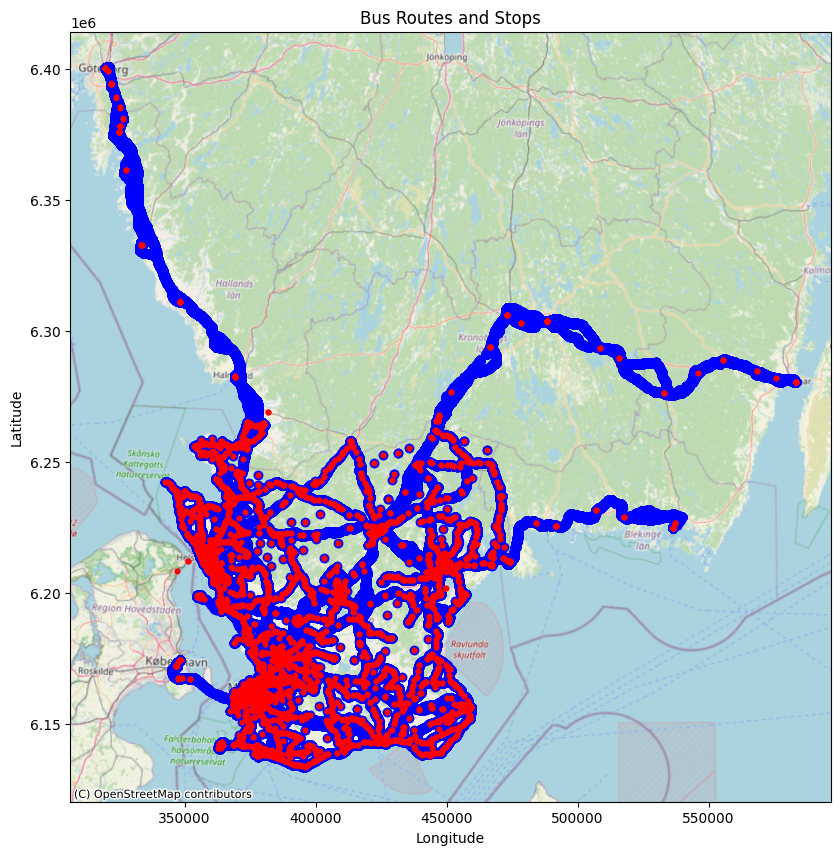

In [242]:
# Plotting on OpenStreetMap
fig, ax = plt.subplots(figsize=(10, 10))

# Plot bus routes (shapes) in blue
gdf_shapes.plot(ax=ax, color='blue', linewidth=1, alpha=0.7)

# Plot bus stops in red
gdf_stops.plot(ax=ax, color='red', markersize=10)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=gdf_stops.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title and labels
ax.set_title('Bus Routes and Stops')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

In [37]:
# 1. Ställ in koordinatsystemet för 'gdf_stops' och 'gdf_shapes' till GPS-koordinater (EPSG:4326).
# 2. Projektera om 'gdf_stops' och 'gdf_shapes' för att matcha det svenska rutnätet (EPSG:3006).

In [241]:
# Set the CRS of gdf_stops to EPSG:4326 (WGS84)
gdf_stops.crs = "EPSG:4326"

# Set the CRS of gdf_shapes to EPSG:4326 (WGS84)
gdf_shapes.crs = "EPSG:4326"

# Reproject gdf_stops to match the CRS EPSG:3006
gdf_stops = gdf_stops.to_crs(CRS.from_epsg(3006))

# Reproject gdf_shapes to match the CRS EPSG:3006
gdf_shapes = gdf_shapes.to_crs(CRS.from_epsg(3006))

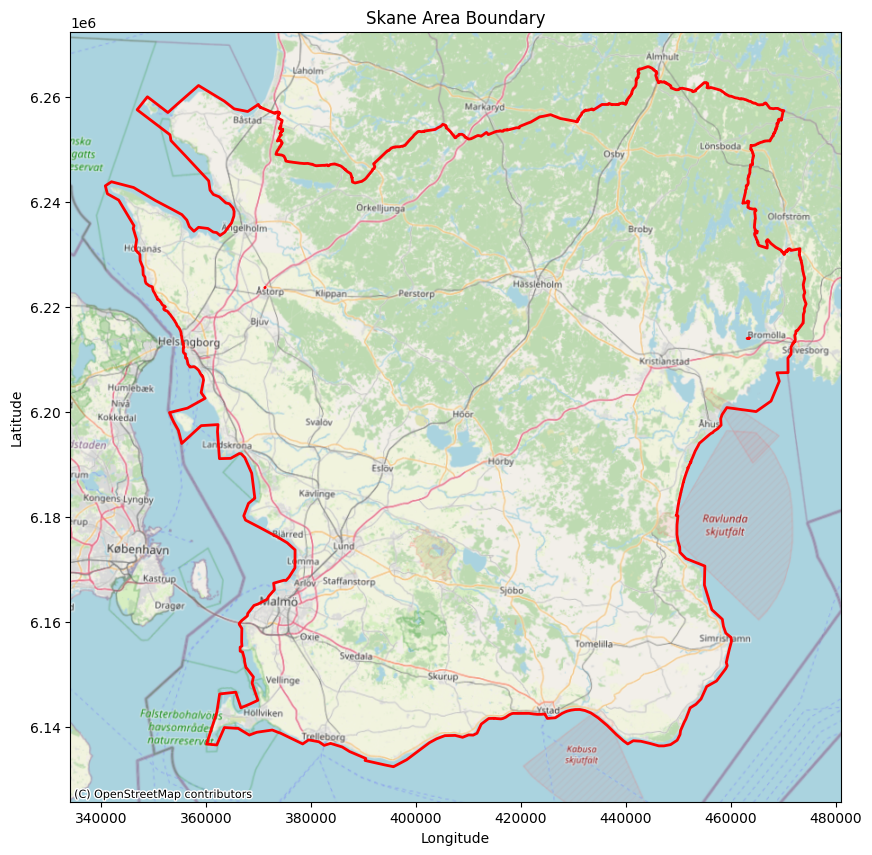

In [243]:
# Read the GeoPackage file into a GeoDataFrame
regso_gdf = gpd.read_file(r'C:\Users\ilts\Documents\TraffikLab\RegSO_2018_v2.gpkg')

# Filter the GeoDataFrame to select only the rows where the "kommun" column starts with "12"
skane_regso = regso_gdf[regso_gdf['kommun'].str.startswith('12')]

# Merge the selected rows to create the Skane area boundary
skane_boundary = skane_regso.unary_union

# Create a GeoDataFrame with the Skane area boundary
skane_boundary_gdf = gpd.GeoDataFrame(geometry=[skane_boundary])

# Set CRS for GeoDataFrame
skane_boundary_gdf.crs = regso_gdf.crs

# Plot the Skane area boundary on an OpenStreetMap base
fig, ax = plt.subplots(figsize=(10, 10))
skane_boundary_gdf.plot(ax=ax, color='none', edgecolor='red', linewidth=2)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=skane_regso.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title and labels
ax.set_title('Skane Area Boundary')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

In [223]:
print(skane_boundary_gdf.crs)
print(gdf_stops.crs)
print(gdf_shapes.crs)

EPSG:3006
EPSG:3006
EPSG:3006


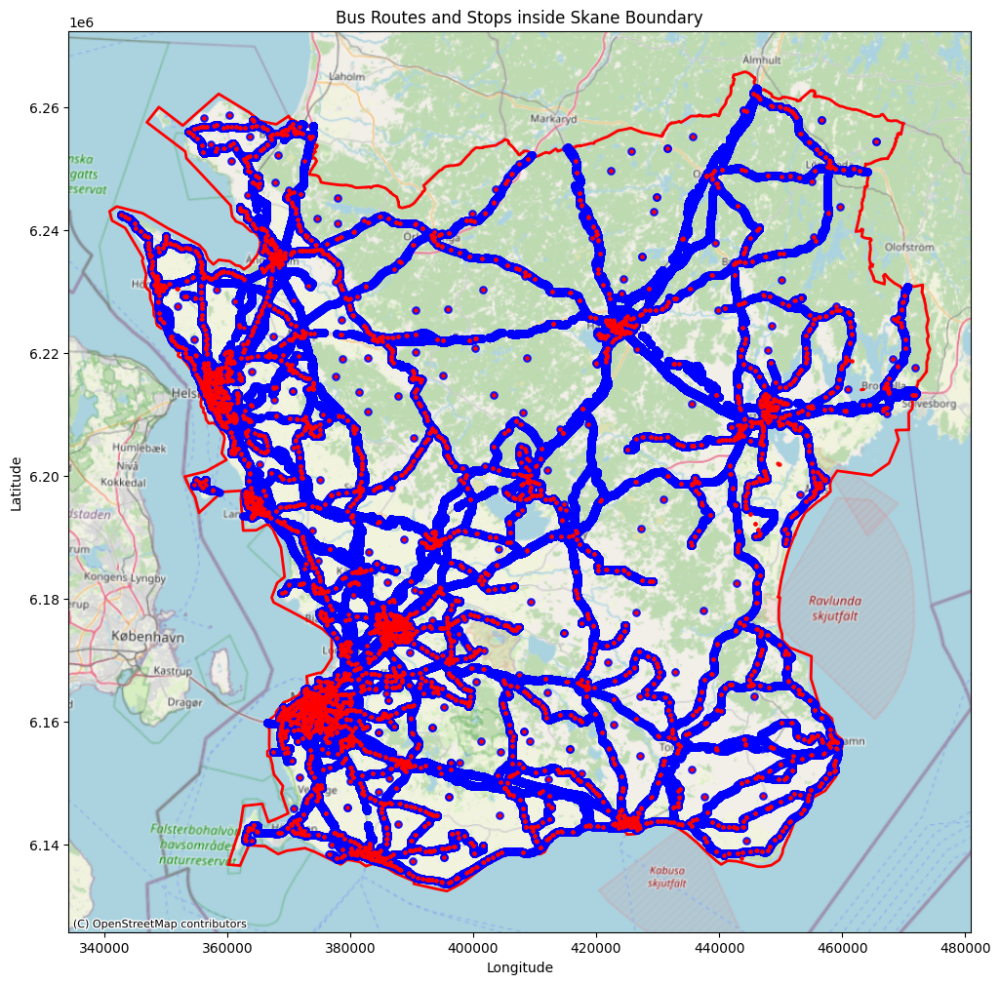

In [244]:
# Spatial join to filter stops inside Skane boundary
gdf_stops_inside = gpd.sjoin(gdf_stops, skane_boundary_gdf, predicate ='within')

# Spatial join to filter shapes inside Skane boundary
gdf_shapes_inside = gpd.sjoin(gdf_shapes, skane_boundary_gdf, predicate ='within')

# Plotting on OpenStreetMap
fig, ax = plt.subplots(figsize=(12, 12))
skane_boundary_gdf.plot(ax=ax, color='none', edgecolor='red', linewidth=2)

# Plot bus routes (shapes) in blue
gdf_shapes_inside.plot(ax=ax, color='blue', linewidth=0.05, alpha=0.7)

# Plot bus stops in red
gdf_stops_inside.plot(ax=ax, color='red', markersize=4)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=gdf_shapes_inside.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title and labels
ax.set_title('Bus Routes and Stops inside Skane Boundary')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()


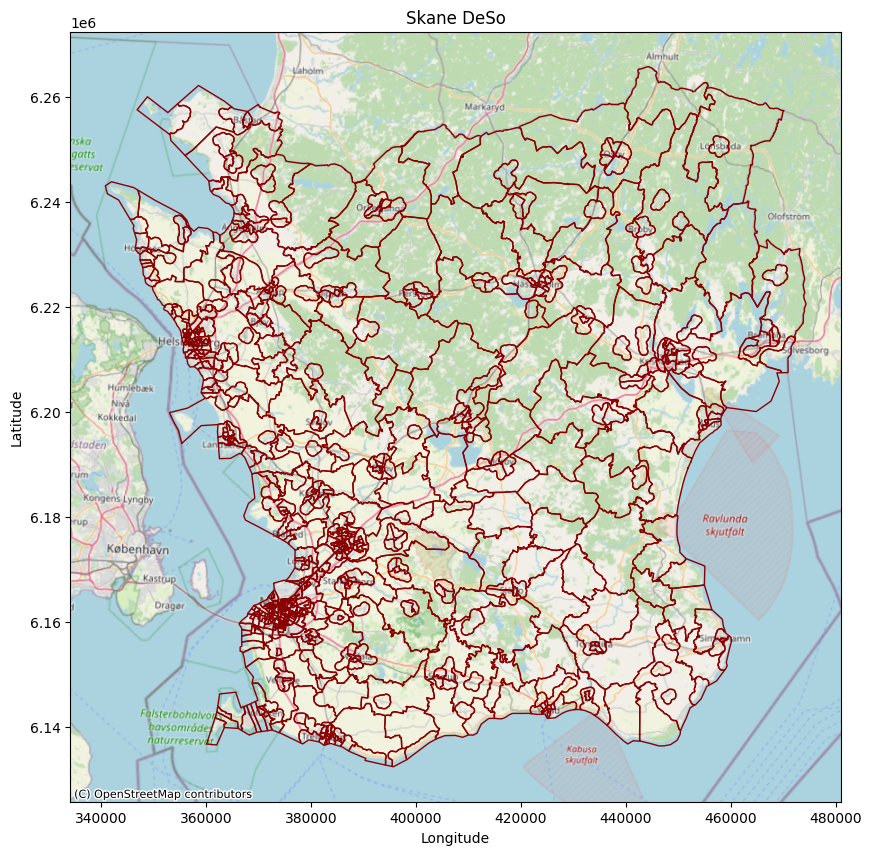

In [245]:
# Read the GeoPackage file into a GeoDataFrame
deso = gpd.read_file(r'C:\Users\ilts\Documents\TraffikLab\DeSO_2018_v2.gpkg')

# Spatial join to filter DeSO data inside Skane boundary
skane_deso = deso[deso['kommun'].str.startswith('12')]

# Plot the Skane DeSO boundary on an OpenStreetMap base
fig, ax = plt.subplots(figsize=(10, 10))

# Plot Skane DeSO boundary
skane_deso.plot(ax=ax, color='none', edgecolor='darkred', linewidth=1)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=skane_deso.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title and labels
ax.set_title('Skane DeSo')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

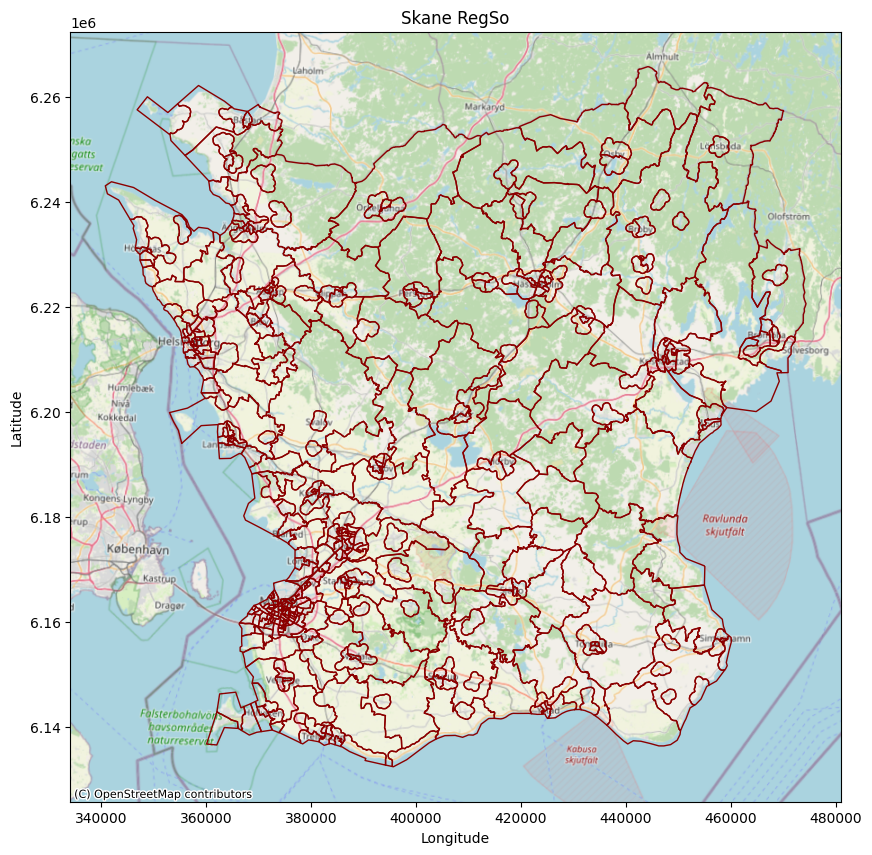

In [246]:
# Spatial join to filter DeSO data inside Skane boundary
skane_regso = gpd.sjoin(regso_gdf, skane_boundary_gdf, predicate ='within')

# Plot the Skane DeSO boundary on an OpenStreetMap base
fig, ax = plt.subplots(figsize=(10, 10))

# Plot Skane DeSO boundary
skane_regso.plot(ax=ax, color='none', edgecolor='darkred', linewidth=1)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=skane_regso.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title and labels
ax.set_title('Skane RegSo')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

#### Count the number of departures by stop

In [44]:
# Group stop_times by stop_id and count the occurrences
stop_counts = stop_times['stop_id'].value_counts()

# Assign the counts to the 'n_departures' column in stops DataFrame
stops['n_departures'] = stops['stop_id'].map(stop_counts)

# Display the updated stops DataFrame
stops.head()


,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code,n_departures
0,9021012002503000,Laholm Repslagargatan,56.511082,13.052599,1,NaN,NaN,NaN
1,9021012002505000,Laholm Glänninge vårdcentral,56.504204,13.051977,1,NaN,NaN,NaN
2,9021012002507000,Laholm Altona,56.503528,13.046210,1,NaN,NaN,NaN
3,9021012002518000,Laholm Kristianstadsvägen,56.507425,13.058259,1,NaN,NaN,NaN
4,9021012003400000,Halmstad Resecentrum,56.669207,12.865548,1,NaN,NaN,NaN


In [45]:
stops.tail()

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code,n_departures
10562,9022012950176001,Helsingborg NO 2,56.078142,12.815026,0,9.021013e+15,A,9.0
10563,9022012950201001,Hässleholm PO 1,56.206215,13.776775,0,9.021013e+15,A,91.0
10564,9022012950202001,Hässleholm PO 2,56.261465,13.829196,0,9.021013e+15,A,82.0
10565,9022012950203001,Hässleholm PO 3,56.348745,13.865674,0,9.021013e+15,A,90.0
10566,9022012950204001,Osby PO 4,56.420126,13.891991,0,9.021013e+15,A,59.0


In [46]:
stop_times.dtypes

trip_id                  int64
arrival_time            object
departure_time          object
stop_id                  int64
stop_sequence            int64
stop_headsign           object
pickup_type              int64
drop_off_type            int64
shape_dist_traveled    float64
timepoint                int64
dtype: object

In [47]:
# Define a function to adjust time values to fall within the valid range
def adjust_time(time):
    # Split the time value into hours, minutes, and seconds
    hours, minutes, seconds = map(int, time.split(':'))
    # If hours exceed 23, adjust them
    if hours >= 24:
        hours -= 24
    # Format and return the adjusted time
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}"

# Read stop_times data
stop_times = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\Skane\stop_times.txt')

# Replace values starting with '24' with '00' in 'departure_time' column
stop_times['departure_time'] = stop_times['departure_time'].str.replace('^24', '00', regex=True)

# Replace values starting with '24' with '00' in 'arrival_time' column
stop_times['arrival_time'] = stop_times['arrival_time'].str.replace('^24', '00', regex=True)

# Convert 'departure_time' and 'arrival_time' columns to datetime format
stop_times[['departure_time', 'arrival_time']] = stop_times[['departure_time', 'arrival_time']].astype('str')

# Apply the adjust_time function to 'departure_time' and 'arrival_time' columns
stop_times['departure_time'] = stop_times['departure_time'].apply(adjust_time)
stop_times['arrival_time'] = stop_times['arrival_time'].apply(adjust_time)

# Convert 'departure_time' and 'arrival_time' columns back to datetime format
stop_times[['departure_time', 'arrival_time']] = stop_times[['departure_time', 'arrival_time']].astype('datetime64[ns]')

# Calculate the time difference in seconds
stop_times['headway'] = (stop_times['departure_time'] - stop_times['arrival_time']).dt.seconds

# Group by stop_id and calculate the mean time difference
average_headway = stop_times.groupby('stop_id')['headway'].mean()


In [48]:
stops['avg_headway'] = stops['stop_id'].map(average_headway)
stops.head()

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code,n_departures,avg_headway
0,9021012002503000,Laholm Repslagargatan,56.511082,13.052599,1,NaN,NaN,NaN,NaN
1,9021012002505000,Laholm Glänninge vårdcentral,56.504204,13.051977,1,NaN,NaN,NaN,NaN
2,9021012002507000,Laholm Altona,56.503528,13.046210,1,NaN,NaN,NaN,NaN
3,9021012002518000,Laholm Kristianstadsvägen,56.507425,13.058259,1,NaN,NaN,NaN,NaN
4,9021012003400000,Halmstad Resecentrum,56.669207,12.865548,1,NaN,NaN,NaN,NaN


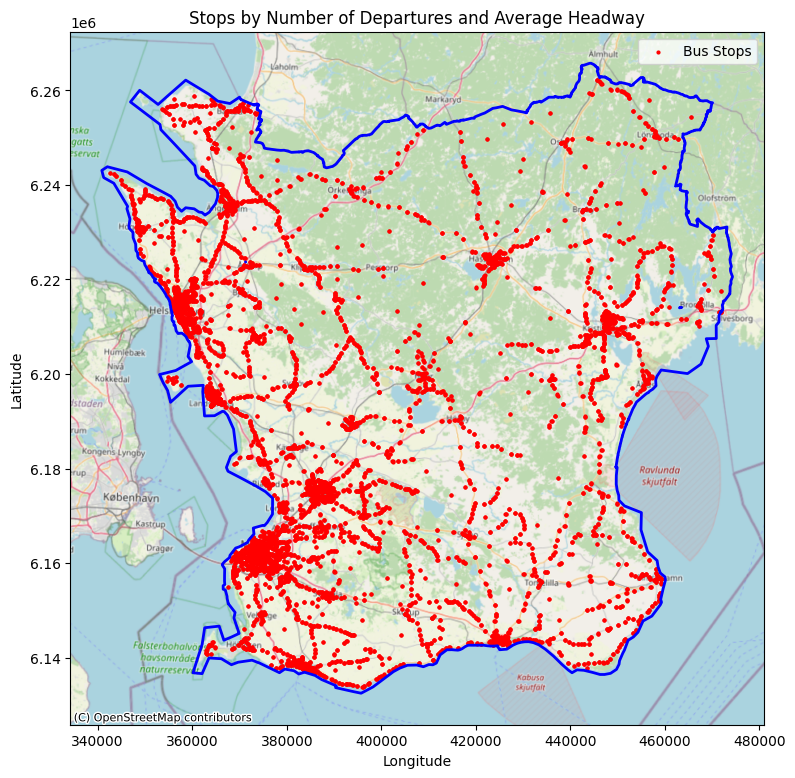

In [49]:
# Spatial join to filter stops inside Skane boundary
gdf_stops_inside = gpd.sjoin(gdf_stops, skane_boundary_gdf, predicate='within')

# Plotting on OpenStreetMap
fig, ax = plt.subplots(figsize=(18, 9))

# Plot bus stops in red
gdf_stops_inside.plot(ax=ax, color='red', markersize=4, label='Bus Stops')
skane_boundary_gdf.plot(ax=ax, color='none', edgecolor='blue', linewidth=2)
# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=gdf_stops_inside.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title and labels
ax.set_title('Stops by Number of Departures and Average Headway')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plots
plt.legend()
plt.show()

In [50]:
stops.columns

Index(['stop_id', 'stop_name', 'stop_lat', 'stop_lon', 'location_type',
       'parent_station', 'platform_code', 'n_departures', 'avg_headway'],
      dtype='object')

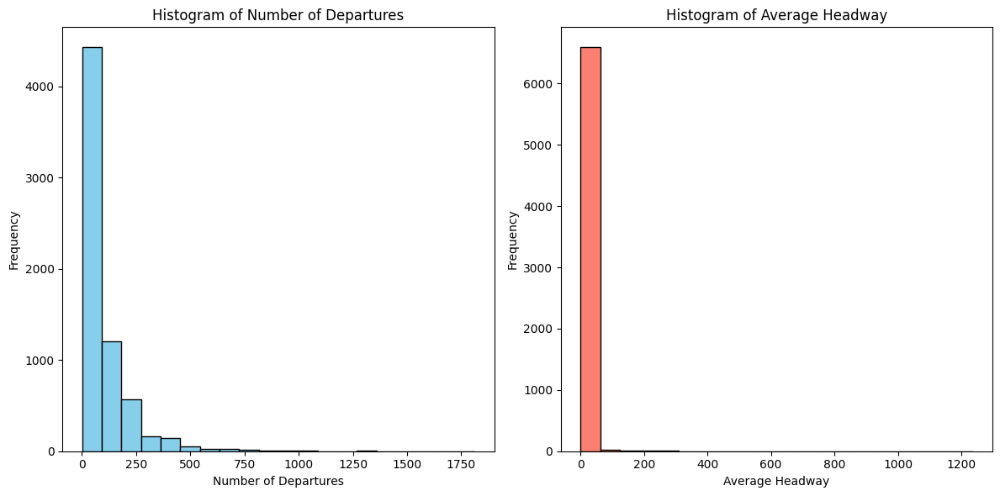

In [51]:
# Plot histograms for 'n_departures' and 'avg_headway'
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Plot histogram for 'n_departures'
axs[0].hist(stops['n_departures'], bins=20, color='skyblue', edgecolor='black')
axs[0].set_title('Histogram of Number of Departures')
axs[0].set_xlabel('Number of Departures')
axs[0].set_ylabel('Frequency')

# Plot histogram for 'avg_headway'
axs[1].hist(stops['avg_headway'], bins=20, color='salmon', edgecolor='black')
axs[1].set_title('Histogram of Average Headway')
axs[1].set_xlabel('Average Headway')
axs[1].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()

In [52]:
stops.dtypes

stop_id             int64
stop_name          object
stop_lat          float64
stop_lon          float64
location_type       int64
parent_station    float64
platform_code      object
n_departures      float64
avg_headway       float64
dtype: object

In [53]:
# Count missing values in the 'n_departures' column
missing_values_count = stops['n_departures'].isnull().sum()

print("Number of missing values in 'n_departures':", missing_values_count)


Number of missing values in 'n_departures': 3921


In [54]:
# Fill missing values in 'n_departures' with 0
stops['n_departures'] = stops['n_departures'].fillna(0)

In [55]:
# Count values less than 0 in 'n_departures' column
negative_values_count = (stops['n_departures'] < 0).sum()

print("Number of values less than 0 in 'n_departures' column:", negative_values_count)


Number of values less than 0 in 'n_departures' column: 0


In [56]:
#stops['n_departures'] = stops['n_departures'].astype(int)

In [57]:
stops['n_departures'].describe()

count    10567.000000
mean        60.574524
std        113.538675
min          0.000000
25%          0.000000
50%         15.000000
75%         70.000000
max       1811.000000
Name: n_departures, dtype: float64

In [58]:
(gdf_stops_inside)

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code,geometry,index_right
112,9021012014000000,Svalöv station,55.911952,13.109591,1,NaN,NaN,POINT (381839.375 6197894.749),0
113,9021012014001000,Svalöv Prästgårdsvägen,55.907281,13.090865,1,NaN,NaN,POINT (380654.713 6197407.142),0
114,9021012014017000,Tågarp torget,55.925159,12.954432,1,NaN,NaN,POINT (372186.057 6199640.229),0
115,9021012014018000,Kullerstensgården,55.901721,13.104800,1,NaN,NaN,POINT (381508.757 6196764.509),0
116,9021012014020000,Svalöv Brandstationen,55.908587,13.106498,1,NaN,NaN,POINT (381635.821 6197525.603),0
...,...,...,...,...,...,...,...,...,...
10562,9022012950176001,Helsingborg NO 2,56.078142,12.815026,0,9.021013e+15,A,POINT (364015.451 6216928.634),0
10563,9022012950201001,Hässleholm PO 1,56.206215,13.776775,0,9.021013e+15,A,POINT (424119.045 6229704.334),0
10564,9022012950202001,Hässleholm PO 2,56.261465,13.829196,0,9.021013e+15,A,POINT (427475.197 6235796.790),0
10565,9022012950203001,Hässleholm PO 3,56.348745,13.865674,0,9.021013e+15,A,POINT (429894.716 6245472.767),0


In [59]:
# Define bin edges based on statistics
bin_edges = [0, 15, 70, 1811]  # Adjusted based on the statistics

# Define category labels
labels = ['Low', 'Medium', 'High']

# Create the 'dep_labels' column
stops['dep_labels'] = pd.cut(stops['n_departures'], bins=bin_edges, labels=labels, right=False)

# Display the DataFrame to verify the new column
print(stops.head())



            stop_id                     stop_name   stop_lat   stop_lon  \
0  9021012002503000         Laholm Repslagargatan  56.511082  13.052599   
1  9021012002505000  Laholm Glänninge vårdcentral  56.504204  13.051977   
2  9021012002507000                 Laholm Altona  56.503528  13.046210   
3  9021012002518000     Laholm Kristianstadsvägen  56.507425  13.058259   
4  9021012003400000          Halmstad Resecentrum  56.669207  12.865548   

   location_type  parent_station platform_code  n_departures  avg_headway  \
0              1             NaN           NaN           0.0          NaN   
1              1             NaN           NaN           0.0          NaN   
2              1             NaN           NaN           0.0          NaN   
3              1             NaN           NaN           0.0          NaN   
4              1             NaN           NaN           0.0          NaN   

  dep_labels  
0        Low  
1        Low  
2        Low  
3        Low  
4        Lo

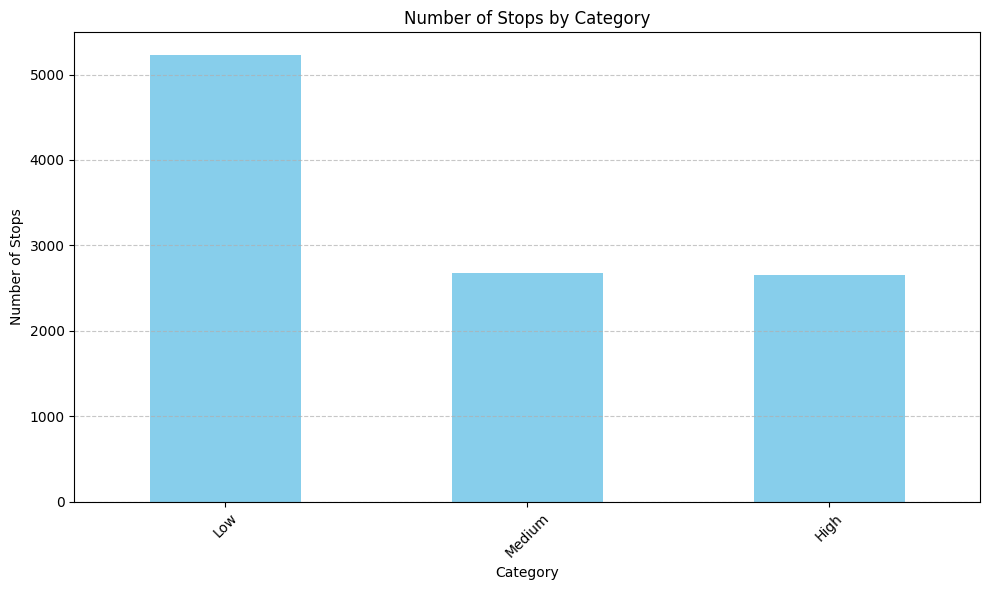

In [60]:
# Count the occurrences of each category
category_counts = stops['dep_labels'].value_counts()

# Plot the bar chart
plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Stops by Category')
plt.xlabel('Category')
plt.ylabel('Number of Stops')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [61]:
gdf_stops.head()

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code,geometry
0,9021012002503000,Laholm Repslagargatan,56.511082,13.052599,1,NaN,NaN,POINT (380161.548 6264662.743)
1,9021012002505000,Laholm Glänninge vårdcentral,56.504204,13.051977,1,NaN,NaN,POINT (380101.566 6263898.436)
2,9021012002507000,Laholm Altona,56.503528,13.046210,1,NaN,NaN,POINT (379744.528 6263833.291)
3,9021012002518000,Laholm Kristianstadsvägen,56.507425,13.058259,1,NaN,NaN,POINT (380498.292 6264245.926)
4,9021012003400000,Halmstad Resecentrum,56.669207,12.865548,1,NaN,NaN,POINT (369200.295 6282600.552)


In [62]:
# Convert to GeoDataFrame
gdf_stops = gpd.GeoDataFrame(stops, geometry=stop_points)

# Set CRS for GeoDataFrame
gdf_stops.crs = "EPSG:4326"  # Assuming the data is in WGS84 coordinate system

# Reproject gdf_stops to match the CRS EPSG:3006
gdf_stops = gdf_stops.to_crs(CRS.from_epsg(3006))

In [63]:
gdf_stops.head()

,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code,n_departures,avg_headway,dep_labels,geometry
0,9021012002503000,Laholm Repslagargatan,56.511082,13.052599,1,NaN,NaN,0.0,NaN,Low,POINT (380161.548 6264662.743)
1,9021012002505000,Laholm Glänninge vårdcentral,56.504204,13.051977,1,NaN,NaN,0.0,NaN,Low,POINT (380101.566 6263898.436)
2,9021012002507000,Laholm Altona,56.503528,13.046210,1,NaN,NaN,0.0,NaN,Low,POINT (379744.528 6263833.291)
3,9021012002518000,Laholm Kristianstadsvägen,56.507425,13.058259,1,NaN,NaN,0.0,NaN,Low,POINT (380498.292 6264245.926)
4,9021012003400000,Halmstad Resecentrum,56.669207,12.865548,1,NaN,NaN,0.0,NaN,Low,POINT (369200.295 6282600.552)


c:\Users\ilts\AppData\Local\Programs\Python\Python312\Lib\site-packages\geopandas\geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\ilts\AppData\Local\Temp\ipykernel_7824\1631511990.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf_stops_within_skane.dropna(subset=['color'], inplace=True)


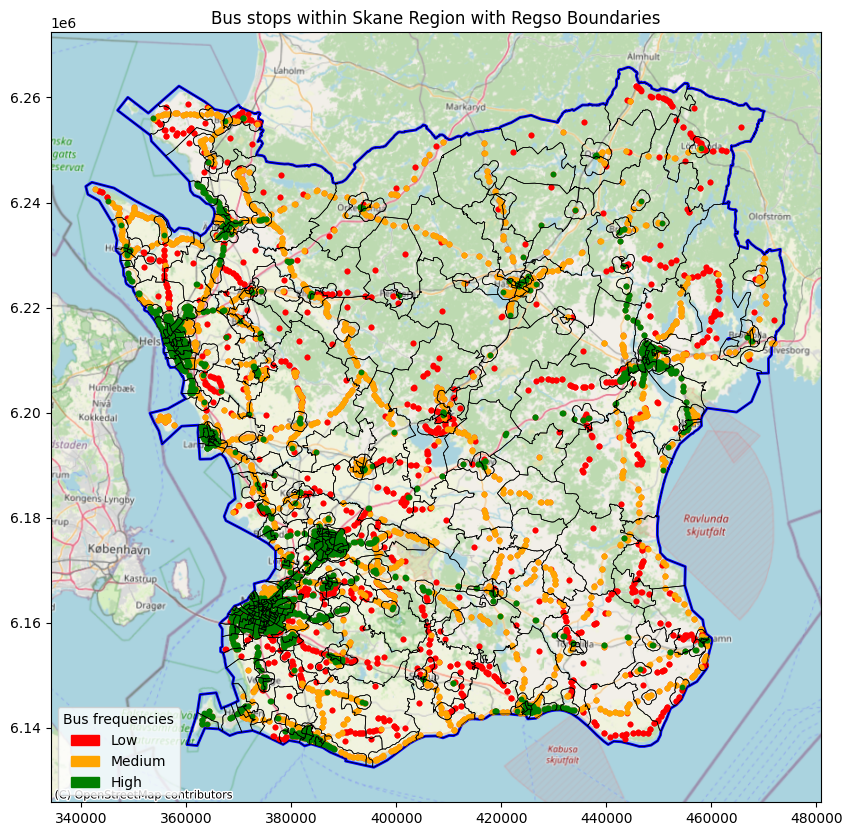

In [64]:
# 1. Plot the border of the Skane region
fig, ax = plt.subplots(figsize=(10, 10))
skane_boundary_gdf.plot(ax=ax, color='none', edgecolor='blue', linewidth=2)

# 2. Filter stops within the Skane region boundary
gdf_stops_within_skane = gdf_stops[gdf_stops.geometry.within(skane_boundary_gdf.unary_union)]

# 3. Assign colors to stops based on the categories in the 'dep_labels' column from the 'stops' DataFrame
colors = {'Low': 'red', 'Medium': 'orange', 'High': 'green'}
gdf_stops_within_skane['color'] = stops.loc[gdf_stops_within_skane.index, 'dep_labels'].map(colors)

# 4. Drop rows with NaN values in the 'color' column
gdf_stops_within_skane.dropna(subset=['color'], inplace=True)

# 5. Plot stops with assigned colors and create legend entries for each category
legend_handles = []
for category, color in colors.items():
    category_data = gdf_stops_within_skane[gdf_stops_within_skane['dep_labels'] == category]
    if not category_data.empty:
        category_handle = mpatches.Patch(color=color, label=category)
        legend_handles.append(category_handle)
        category_data.plot(ax=ax, color=color, markersize=10, label=category)

# 6. Add Regso boundaries
skane_regso.plot(ax=ax, color='none', edgecolor='black', linewidth=0.5)

# 7. Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=gdf_stops_within_skane.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# 8. Set plot title and legend
plt.title('Bus stops within Skane Region with Regso Boundaries')
plt.legend(handles=legend_handles, title='Bus frequencies')

# 9. Show the plot
plt.show()


In [65]:
skane_regso = skane_regso.drop(columns=['index_right'])

In [66]:
skane_regso.head()

,uuid,regsokod,kommunregso,regso,kommun,kommunnamn,version,geometry
3,D6931531-C051-4A6E-AE70-991FFCA0D655,1281R006,1281 Delphinen-Kämnärsvägen,Delphinen-Kämnärsvägen,1281,Lund,2018_v2,"POLYGON ((388509.003 6176682.144, 388365.905 6..."
29,A4EF6372-6527-4C0E-8B71-2CFFE7898C17,1283R005,1283 Drottninghög,Drottninghög,1283,Helsingborg,2018_v2,"POLYGON ((358991.082 6215272.229, 358838.674 6..."
45,51D7F3CB-8727-40F4-8060-63E3E7863E34,1261R002,1261 Dösjebro,Dösjebro,1261,Kävlinge,2018_v2,"POLYGON ((379061.789 6187075.809, 379061.789 6..."
47,425A7615-3D65-47FB-91F4-9133C083654A,1286R002,1286 Edvinshem-Västra Sjöstaden-Åkesholm,Edvinshem-Västra Sjöstaden-Åkesholm,1286,Ystad,2018_v2,"POLYGON ((424394.258 6143296.850, 424292.298 6..."
48,70A8BEC2-AFAA-40FB-B456-8487389BC78F,1286R003,1286 Egna hem-Solbacken,Egna hem-Solbacken,1286,Ystad,2018_v2,"POLYGON ((425856.510 6143411.777, 425768.452 6..."


In [67]:
skane_deso.head()

,uuid,deso,kommun,lan,kommunnamn,lannamn,version,geometry
0,{8DE2583C-6A92-45B5-AD41-7F40B7A90862},1256B2010,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((442392.479 6229549.453, 442336.506 6..."
3,{5AF0864D-40F8-4599-8AA6-636D82976DB3},1292A0010,1292,12,Ängelholm,Skåne,2018_v2,"POLYGON ((362874.833 6230834.202, 363017.173 6..."
9,{502B37EF-F99E-49FA-8AE9-689977ADBA90},1293A0030,1293,12,Hässleholm,Skåne,2018_v2,"POLYGON ((428549.363 6229473.419, 428688.223 6..."
11,{06D3946E-BF4F-4250-ABFB-59DEC7568808},1256B2020,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((445231.902 6229682.276, 445233.485 6..."
23,{5893A554-E321-47E1-8314-1F66C8702354},1284C1060,1284,12,Höganäs,Skåne,2018_v2,"POLYGON ((348816.642 6230586.542, 349053.743 6..."


C:\Users\ilts\AppData\Roaming\Python\Python312\site-packages\IPython\core\interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


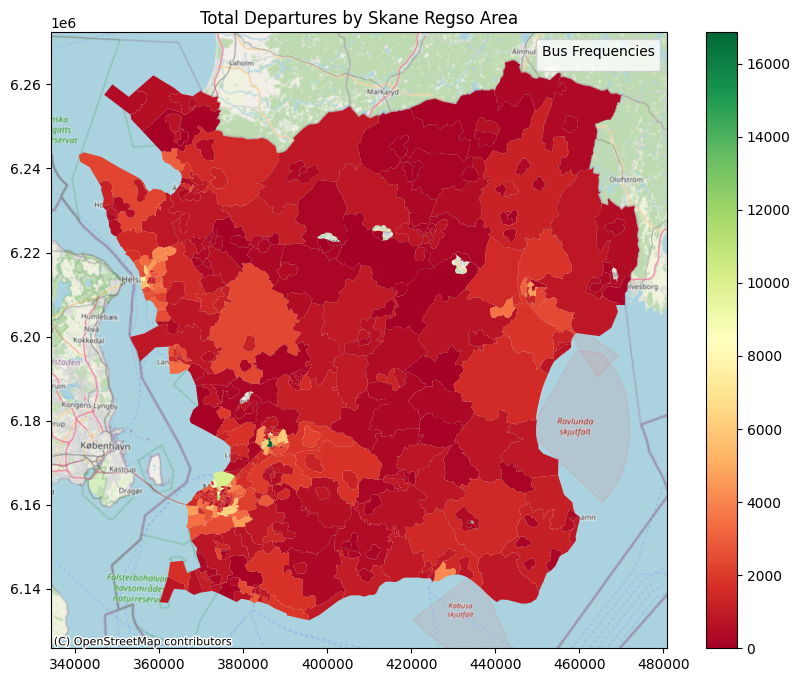

In [68]:
# Perform spatial join
joined_data = gpd.sjoin(gdf_stops, skane_regso, op='within')

# Aggregate n_departures by skane_regso area
agg_data = joined_data.groupby('regsokod')['n_departures'].sum().reset_index()

# Merge aggregated data back to skane_regso
skane_regso_with_agg = skane_regso.merge(agg_data, left_on='regsokod', right_on='regsokod', how='left')

# Plot the map
fig, ax = plt.subplots(figsize=(10, 8))
skane_regso_with_agg.plot(ax=ax, column='n_departures', cmap='RdYlGn', legend=True)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=skane_regso_with_agg.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title and legend
plt.title('Total Departures by Skane Regso Area')
plt.legend(title='Bus Frequencies')

# Show the plot
plt.show()


In [69]:
skane_regso_with_agg.head()

,uuid,regsokod,kommunregso,regso,kommun,kommunnamn,version,geometry,n_departures
0,D6931531-C051-4A6E-AE70-991FFCA0D655,1281R006,1281 Delphinen-Kämnärsvägen,Delphinen-Kämnärsvägen,1281,Lund,2018_v2,"POLYGON ((388509.003 6176682.144, 388365.905 6...",1413.0
1,A4EF6372-6527-4C0E-8B71-2CFFE7898C17,1283R005,1283 Drottninghög,Drottninghög,1283,Helsingborg,2018_v2,"POLYGON ((358991.082 6215272.229, 358838.674 6...",1643.0
2,51D7F3CB-8727-40F4-8060-63E3E7863E34,1261R002,1261 Dösjebro,Dösjebro,1261,Kävlinge,2018_v2,"POLYGON ((379061.789 6187075.809, 379061.789 6...",223.0
3,425A7615-3D65-47FB-91F4-9133C083654A,1286R002,1286 Edvinshem-Västra Sjöstaden-Åkesholm,Edvinshem-Västra Sjöstaden-Åkesholm,1286,Ystad,2018_v2,"POLYGON ((424394.258 6143296.850, 424292.298 6...",743.0
4,70A8BEC2-AFAA-40FB-B456-8487389BC78F,1286R003,1286 Egna hem-Solbacken,Egna hem-Solbacken,1286,Ystad,2018_v2,"POLYGON ((425856.510 6143411.777, 425768.452 6...",1285.0


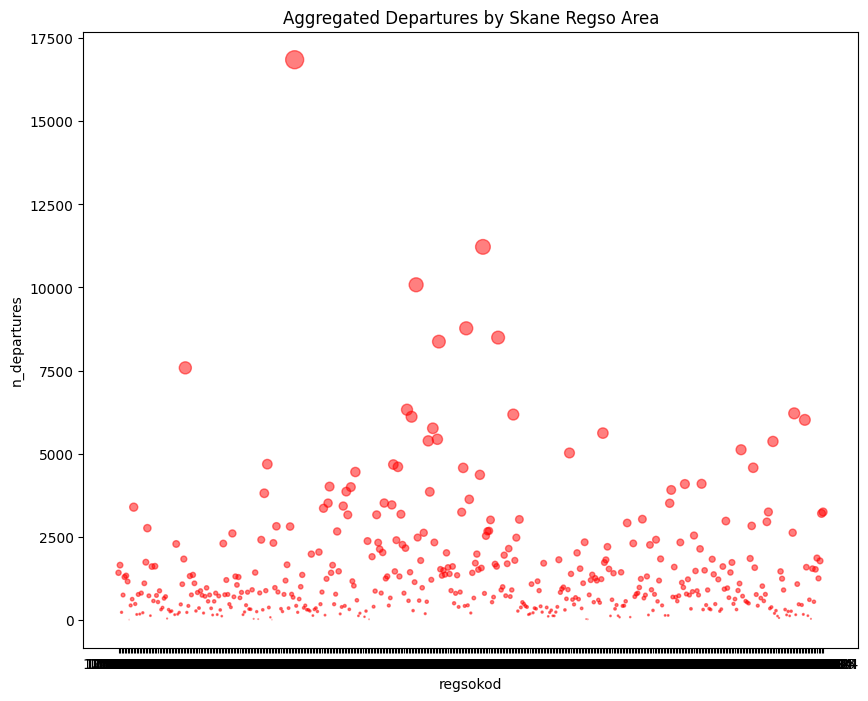

In [70]:
# Plot aggregated values in scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(skane_regso_with_agg['regsokod'], skane_regso_with_agg['n_departures'], s=skane_regso_with_agg['n_departures'] * 0.01, color='red', alpha=0.5)

# Set labels and title
plt.xlabel('regsokod')
plt.ylabel('n_departures')
plt.title('Aggregated Departures by Skane Regso Area')

# Show the plot
plt.show()


In [71]:
# Filter rows where number of departures is over 10000
high_departures = skane_regso_with_agg[skane_regso_with_agg['n_departures'] > 10000]

# Print regsokod with number of departures over 10000
print(high_departures[['regsokod', 'n_departures']])


     regsokod  n_departures
116  1281R013       16855.0
196  1280R025       10081.0
240  1280R071       11222.0


C:\Users\ilts\AppData\Roaming\Python\Python312\site-packages\IPython\core\interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


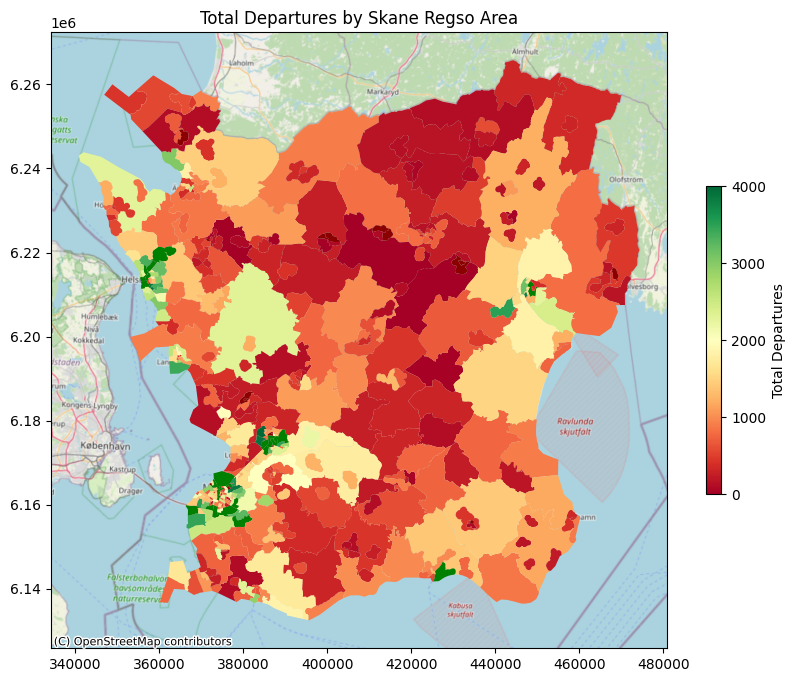

In [72]:
# Define color mapping function
def map_color(value):
    if pd.isnull(value) or value == 0:
        return 'darkred'
    elif value > 4000:
        return 'green'
    else:
        return plt.cm.RdYlGn(value / 4000)

# Perform spatial join
joined_data = gpd.sjoin(gdf_stops, skane_regso, op='within')

# Aggregate n_departures by skane_regso area
agg_data = joined_data.groupby('regsokod')['n_departures'].sum().reset_index()

# Merge aggregated data back to skane_regso
skane_regso_with_agg = skane_regso.merge(agg_data, left_on='regsokod', right_on='regsokod', how='left')

# Create a new column 'color' using the color mapping function
skane_regso_with_agg['color'] = skane_regso_with_agg['n_departures'].apply(map_color)

# Plot the map
fig, ax = plt.subplots(figsize=(10, 8))
skane_regso_with_agg.plot(ax=ax, color=skane_regso_with_agg['color'])

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=skane_regso_with_agg.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title
plt.title('Total Departures by Skane Regso Area')

# Create a color bar for reference
sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=0, vmax=4000))
sm._A = []
cbar = plt.colorbar(sm, orientation='vertical', ax=ax, shrink=0.5)
cbar.set_label('Total Departures')
cbar.set_ticks([0, 1000, 2000, 3000, 4000])

# Show the plot
plt.show()

# Working with SCB 

In [73]:
import requests
import zipfile
import io
import os


In [74]:
!pip install -q pyscbwrapper
from pyscbwrapper import SCB
#Fetch and print out the specific table "PersBilarDeso" found in SCBs tree like API structure
scb = SCB('sv', 'TK', 'TK1001', 'TK1001Z', 'PersBilarDeso')
scb.info()

{'title': 'Personbilar i trafik efter region, status, tabellinnehåll och år',
 'variables': [{'code': 'Region',
   'text': 'region',
   'values': ['00',
    '01',
    '0114',
    '0114A0010',
    '0114C1010',
    '0114C1020',
    '0114C1030',
    '0114C1040',
    '0114C1050',
    '0114C1060',
    '0114C1070',
    '0114C1080',
    '0114C1090',
    '0114C1100',
    '0114C1110',
    '0114C1120',
    '0114C1130',
    '0114C1140',
    '0114C1150',
    '0114C1160',
    '0114C1170',
    '0114C1180',
    '0114C1190',
    '0114C1200',
    '0114C1210',
    '0114C1220',
    '0114R001',
    '0114R002',
    '0114R003',
    '0114R004',
    '0114R005',
    '0114R006',
    '0114R007',
    '0114R008',
    '0114R009',
    '0114R010',
    '0114R011',
    '0114R012',
    '0115',
    '0115A0010',
    '0115A0020',
    '0115A0030',
    '0115A0040',
    '0115B2010',
    '0115B3010',
    '0115C1010',
    '0115C1020',
    '0115C1030',
    '0115C1040',
    '0115C1050',
    '0115C1060',
    '0115C1070',
    '0115

In [75]:
scb.get_variables()

{'region': ['00 Riket',
  '01 Stockholms län',
  '0114 Upplands Väsby',
  '0114A0010',
  '0114C1010',
  '0114C1020',
  '0114C1030',
  '0114C1040',
  '0114C1050',
  '0114C1060',
  '0114C1070',
  '0114C1080',
  '0114C1090',
  '0114C1100',
  '0114C1110',
  '0114C1120',
  '0114C1130',
  '0114C1140',
  '0114C1150',
  '0114C1160',
  '0114C1170',
  '0114C1180',
  '0114C1190',
  '0114C1200',
  '0114C1210',
  '0114C1220',
  'Upplands Väsby (Bollstanäs)',
  'Upplands Väsby (Hammarby-Vaxmyra)',
  'Upplands Väsby (Odenslunda norra-Frestaby-Ekeby)',
  'Upplands Väsby (Odenslunda södra-Bredden)',
  'Upplands Väsby (Runby norra)',
  'Upplands Väsby (Runby södra-Ed)',
  'Upplands Väsby (Skälby-Brunnby Vik)',
  'Upplands Väsby (Smedby södra-Älvsunda)',
  'Upplands Väsby (Upplands Väsby centrum-Smedby norra)',
  'Upplands Väsby (Upplands Väsby omland)',
  'Upplands Väsby (Vilunda västra)',
  'Upplands Väsby (Vilunda östra)',
  '0115 Vallentuna',
  '0115A0010',
  '0115A0020',
  '0115A0030',
  '0115A0040'

In [76]:
import re
#Use regular expression to filter each object which starts with "0180C" (Each DeSO area of Stockholm municipality starts with this)
regioner = scb.get_variables()['region']
r = re.compile('^12')
deso = list(filter(r.match, regioner))

#Create a query of the table with specified parameters for region, status, tabellinnehåll and år
scb.set_query(region=deso,
              status=["i trafik"],
              tabellinnehåll=["Personbilar i trafik"],
              år=["2023"])

In [77]:
#Extract the table from the API using the query created above
scb_data_bilar = scb.get_data()
#Print out the queried table
scb_data_bilar

{'columns': [{'code': 'Region', 'text': 'region', 'type': 'd'},
  {'code': 'Bestand', 'text': 'status', 'type': 'd'},
  {'code': 'Tid', 'text': 'år', 'type': 't'},
  {'code': '000005Z2', 'text': 'Personbilar i trafik', 'type': 'c'}],
 'comments': [],
 'data': [{'key': ['12', 'ITRAF', '2023'], 'values': ['582094']},
  {'key': ['1214', 'ITRAF', '2023'], 'values': ['7866']},
  {'key': ['1214A0010', 'ITRAF', '2023'], 'values': ['693']},
  {'key': ['1214A0020', 'ITRAF', '2023'], 'values': ['1153']},
  {'key': ['1214A0030', 'ITRAF', '2023'], 'values': ['1042']},
  {'key': ['1214A0040', 'ITRAF', '2023'], 'values': ['589']},
  {'key': ['1214B2010', 'ITRAF', '2023'], 'values': ['948']},
  {'key': ['1214B3010', 'ITRAF', '2023'], 'values': ['876']},
  {'key': ['1214B4010', 'ITRAF', '2023'], 'values': ['651']},
  {'key': ['1214C1010', 'ITRAF', '2023'], 'values': ['970']},
  {'key': ['1214C1020', 'ITRAF', '2023'], 'values': ['944']},
  {'key': ['1230', 'ITRAF', '2023'], 'values': ['12427']},
  {'ke

In [78]:
#Extract the data from the table
scb_uttag = scb_data_bilar['data']
scb_uttag

[{'key': ['12', 'ITRAF', '2023'], 'values': ['582094']},
 {'key': ['1214', 'ITRAF', '2023'], 'values': ['7866']},
 {'key': ['1214A0010', 'ITRAF', '2023'], 'values': ['693']},
 {'key': ['1214A0020', 'ITRAF', '2023'], 'values': ['1153']},
 {'key': ['1214A0030', 'ITRAF', '2023'], 'values': ['1042']},
 {'key': ['1214A0040', 'ITRAF', '2023'], 'values': ['589']},
 {'key': ['1214B2010', 'ITRAF', '2023'], 'values': ['948']},
 {'key': ['1214B3010', 'ITRAF', '2023'], 'values': ['876']},
 {'key': ['1214B4010', 'ITRAF', '2023'], 'values': ['651']},
 {'key': ['1214C1010', 'ITRAF', '2023'], 'values': ['970']},
 {'key': ['1214C1020', 'ITRAF', '2023'], 'values': ['944']},
 {'key': ['1230', 'ITRAF', '2023'], 'values': ['12427']},
 {'key': ['1230A0010', 'ITRAF', '2023'], 'values': ['1177']},
 {'key': ['1230A0020', 'ITRAF', '2023'], 'values': ['288']},
 {'key': ['1230B2010', 'ITRAF', '2023'], 'values': ['1173']},
 {'key': ['1230B2020', 'ITRAF', '2023'], 'values': ['1165']},
 {'key': ['1230C1010', 'ITRAF'

In [79]:
#Extract the deso key values into a list
koder = scb.get_query()['query'][0]['selection']['values']
#Create a dictionary of the deso key values which will be used in the next step
desodic = {}
for i in range(len(koder)):
  desodic[koder[i]] = koder[i]
desodic

{'12': '12',
 '1214': '1214',
 '1214A0010': '1214A0010',
 '1214A0020': '1214A0020',
 '1214A0030': '1214A0030',
 '1214A0040': '1214A0040',
 '1214B2010': '1214B2010',
 '1214B3010': '1214B3010',
 '1214B4010': '1214B4010',
 '1214C1010': '1214C1010',
 '1214C1020': '1214C1020',
 '1230': '1230',
 '1230A0010': '1230A0010',
 '1230A0020': '1230A0020',
 '1230B2010': '1230B2010',
 '1230B2020': '1230B2020',
 '1230C1010': '1230C1010',
 '1230C1020': '1230C1020',
 '1230C1030': '1230C1030',
 '1230C1040': '1230C1040',
 '1230C1050': '1230C1050',
 '1230C1060': '1230C1060',
 '1230C1070': '1230C1070',
 '1230C1080': '1230C1080',
 '1231': '1231',
 '1231C1010': '1231C1010',
 '1231C1020': '1231C1020',
 '1231C1030': '1231C1030',
 '1231C1040': '1231C1040',
 '1231C1050': '1231C1050',
 '1231C1060': '1231C1060',
 '1231C1070': '1231C1070',
 '1231C1080': '1231C1080',
 '1231C1090': '1231C1090',
 '1231C1100': '1231C1100',
 '1233': '1233',
 '1233A0010': '1233A0010',
 '1233A0020': '1233A0020',
 '1233B2010': '1233B2010',
 

In [80]:
#Create a new dictionary called desodata for which the data will be reformatted to a desired structure
#Each deso key value will be represented as a key in the dictionary and all the values will be a nested dictionary with key, value pairs
desodata = {}
for kod in desodic:
    desodata[desodic[kod]] = {}
    for i in range(len(scb_uttag)):
        if scb_uttag[i]['key'][0] == kod:
            desodata[desodic[kod]][scb_uttag[i]['key'][1]] = scb_uttag[i]['values']    
desodata

{'12': {'ITRAF': ['582094']},
 '1214': {'ITRAF': ['7866']},
 '1214A0010': {'ITRAF': ['693']},
 '1214A0020': {'ITRAF': ['1153']},
 '1214A0030': {'ITRAF': ['1042']},
 '1214A0040': {'ITRAF': ['589']},
 '1214B2010': {'ITRAF': ['948']},
 '1214B3010': {'ITRAF': ['876']},
 '1214B4010': {'ITRAF': ['651']},
 '1214C1010': {'ITRAF': ['970']},
 '1214C1020': {'ITRAF': ['944']},
 '1230': {'ITRAF': ['12427']},
 '1230A0010': {'ITRAF': ['1177']},
 '1230A0020': {'ITRAF': ['288']},
 '1230B2010': {'ITRAF': ['1173']},
 '1230B2020': {'ITRAF': ['1165']},
 '1230C1010': {'ITRAF': ['1476']},
 '1230C1020': {'ITRAF': ['1237']},
 '1230C1030': {'ITRAF': ['1055']},
 '1230C1040': {'ITRAF': ['778']},
 '1230C1050': {'ITRAF': ['1261']},
 '1230C1060': {'ITRAF': ['967']},
 '1230C1070': {'ITRAF': ['978']},
 '1230C1080': {'ITRAF': ['872']},
 '1231': {'ITRAF': ['7660']},
 '1231C1010': {'ITRAF': ['623']},
 '1231C1020': {'ITRAF': ['930']},
 '1231C1030': {'ITRAF': ['520']},
 '1231C1040': {'ITRAF': ['782']},
 '1231C1050': {'ITRA

In [81]:
#Create a pandas dataframe from the dictionary "desodata"
data_bilar = pd.DataFrame.from_dict(desodata, orient='index').rename_axis('deso').reset_index()
data_bilar.head()

,deso,ITRAF
0,12,[582094]
1,1214,[7866]
2,1214A0010,[693]
3,1214A0020,[1153]
4,1214A0030,[1042]


In [82]:
#Explode the values (which are nested in lists) into new columns and drop the old columns
data_bilar[['bilar']] = pd.DataFrame(data_bilar.ITRAF.tolist(), index= data_bilar.index)

In [83]:
data_bilar.dtypes


deso     object
ITRAF    object
bilar    object
dtype: object

In [84]:
# Extract numeric part and convert to integer for 'Bilar' column in data_bilar DataFrame
data_bilar['bilar'] = data_bilar['bilar'].apply(lambda x: int(re.search(r'\d+', x).group(0)) if isinstance(x, str) else x)

# Output DataFrame
print(data_bilar)


          deso     ITRAF   bilar
0           12  [582094]  582094
1         1214    [7866]    7866
2    1214A0010     [693]     693
3    1214A0020    [1153]    1153
4    1214A0030    [1042]    1042
..         ...       ...     ...
818  1293C1090     [901]     901
819  1293C1100     [589]     589
820  1293C1110     [680]     680
821  1293C1120     [992]     992
822  1293C1130     [818]     818

[823 rows x 3 columns]


In [85]:
data_bilar = data_bilar.drop(columns=['ITRAF'])

In [86]:
data_bilar.head()

,deso,bilar
0,12,582094
1,1214,7866
2,1214A0010,693
3,1214A0020,1153
4,1214A0030,1042


In [87]:
skane_deso.head()

,uuid,deso,kommun,lan,kommunnamn,lannamn,version,geometry
0,{8DE2583C-6A92-45B5-AD41-7F40B7A90862},1256B2010,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((442392.479 6229549.453, 442336.506 6..."
3,{5AF0864D-40F8-4599-8AA6-636D82976DB3},1292A0010,1292,12,Ängelholm,Skåne,2018_v2,"POLYGON ((362874.833 6230834.202, 363017.173 6..."
9,{502B37EF-F99E-49FA-8AE9-689977ADBA90},1293A0030,1293,12,Hässleholm,Skåne,2018_v2,"POLYGON ((428549.363 6229473.419, 428688.223 6..."
11,{06D3946E-BF4F-4250-ABFB-59DEC7568808},1256B2020,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((445231.902 6229682.276, 445233.485 6..."
23,{5893A554-E321-47E1-8314-1F66C8702354},1284C1060,1284,12,Höganäs,Skåne,2018_v2,"POLYGON ((348816.642 6230586.542, 349053.743 6..."


In [88]:
# Merge the 'skane_deso' and 'data_bilar' DataFrames on the 'deso' column
skane_deso = skane_deso.merge(data_bilar[['deso', 'bilar']], on='deso', how='left')

# Output DataFrame
print(skane_deso)

                                       uuid       deso kommun lan  \
0    {8DE2583C-6A92-45B5-AD41-7F40B7A90862}  1256B2010   1256  12   
1    {5AF0864D-40F8-4599-8AA6-636D82976DB3}  1292A0010   1292  12   
2    {502B37EF-F99E-49FA-8AE9-689977ADBA90}  1293A0030   1293  12   
3    {06D3946E-BF4F-4250-ABFB-59DEC7568808}  1256B2020   1256  12   
4    {5893A554-E321-47E1-8314-1F66C8702354}  1284C1060   1284  12   
..                                      ...        ...    ...  ..   
784  {E0273AF2-B393-4751-9233-D8C1DCBC742F}  1272B2010   1272  12   
785  {78E0CE59-CAF8-49BA-B179-1E652705BA19}  1284C1040   1284  12   
786  {19E98D52-2450-4A1F-A86B-2E085F6CA280}  1277A0010   1277  12   
787  {10C5155B-A081-4FE8-B88A-13EB33A2788F}  1284C1050   1284  12   
788  {11639A7C-7C30-44BB-97CD-12989DF0CA8D}  1292B4010   1292  12   

       kommunnamn lannamn  version  \
0    Östra Göinge   Skåne  2018_v2   
1       Ängelholm   Skåne  2018_v2   
2      Hässleholm   Skåne  2018_v2   
3    Östra Göinge  

#### Population from SCB

In [89]:
scb = SCB('sv', 'UF', 'UF0506', 'UF0506YDeso', 'UtbSUNBefDesoRegso')
scb.info()

{'title': 'Befolkning 25-64 år efter region, utbildningsnivå, tabellinnehåll och år',
 'variables': [{'code': 'Region',
   'text': 'region',
   'values': ['00',
    '01',
    '0114',
    '0114A0010',
    '0114C1010',
    '0114C1020',
    '0114C1030',
    '0114C1040',
    '0114C1050',
    '0114C1060',
    '0114C1070',
    '0114C1080',
    '0114C1090',
    '0114C1100',
    '0114C1110',
    '0114C1120',
    '0114C1130',
    '0114C1140',
    '0114C1150',
    '0114C1160',
    '0114C1170',
    '0114C1180',
    '0114C1190',
    '0114C1200',
    '0114C1210',
    '0114C1220',
    '0114R001',
    '0114R002',
    '0114R003',
    '0114R004',
    '0114R005',
    '0114R006',
    '0114R007',
    '0114R008',
    '0114R009',
    '0114R010',
    '0114R011',
    '0114R012',
    '0115',
    '0115A0010',
    '0115A0020',
    '0115A0030',
    '0115A0040',
    '0115B2010',
    '0115B3010',
    '0115C1010',
    '0115C1020',
    '0115C1030',
    '0115C1040',
    '0115C1050',
    '0115C1060',
    '0115C1070',
 

In [90]:
scb.get_variables()

{'region': ['00 Riket',
  '01 Stockholms län',
  '0114 Upplands Väsby',
  '0114A0010',
  '0114C1010',
  '0114C1020',
  '0114C1030',
  '0114C1040',
  '0114C1050',
  '0114C1060',
  '0114C1070',
  '0114C1080',
  '0114C1090',
  '0114C1100',
  '0114C1110',
  '0114C1120',
  '0114C1130',
  '0114C1140',
  '0114C1150',
  '0114C1160',
  '0114C1170',
  '0114C1180',
  '0114C1190',
  '0114C1200',
  '0114C1210',
  '0114C1220',
  'Upplands Väsby (Bollstanäs)',
  'Upplands Väsby (Hammarby-Vaxmyra)',
  'Upplands Väsby (Odenslunda norra-Frestaby-Ekeby)',
  'Upplands Väsby (Odenslunda södra-Bredden)',
  'Upplands Väsby (Runby norra)',
  'Upplands Väsby (Runby södra-Ed)',
  'Upplands Väsby (Skälby-Brunnby Vik)',
  'Upplands Väsby (Smedby södra-Älvsunda)',
  'Upplands Väsby (Upplands Väsby centrum-Smedby norra)',
  'Upplands Väsby (Upplands Väsby omland)',
  'Upplands Väsby (Vilunda västra)',
  'Upplands Väsby (Vilunda östra)',
  '0115 Vallentuna',
  '0115A0010',
  '0115A0020',
  '0115A0030',
  '0115A0040'

In [91]:
#Use regular expression to filter each object which starts with "0180C" (Each DeSO area of Stockholm municipality starts with this)
regioner = scb.get_variables()['region']
r = re.compile('^12')
deso = list(filter(r.match, regioner))

#Create a query of the table with specified parameters for region, utbildningsnivå, tabellinnehåll and år
scb.set_query(region=deso,
              utbildningsnivå=["förgymnasial utbildning",
                            "gymnasial utbildning",
                            "eftergymnasial utbildning, mindre än 3 år",
                            "eftergymnasial utbildning, 3 år eller mer",
                            "uppgift om utbildningsnivå saknas"],
              tabellinnehåll=["Befolkning"],
              år=["2022"])

In [92]:
#Extract the table from the API using the query created above
scb_data = scb.get_data()
#Print out the queried table
scb_data

{'columns': [{'code': 'Region', 'text': 'region', 'type': 'd'},
  {'code': 'UtbildningsNiva',
   'text': 'utbildningsnivå',
   'comment': 'Nivåklassificeringen är gjord enligt Svensk Utbildningsnomenklatur (SUN).\r\n',
   'type': 'd'},
  {'code': 'Tid', 'text': 'år', 'type': 't'},
  {'code': '000005MO', 'text': 'Befolkning', 'type': 'c'}],
 'comments': [],
 'data': [{'key': ['12', '21', '2022'], 'values': ['76090']},
  {'key': ['12', '3+4', '2022'], 'values': ['280270']},
  {'key': ['12', '5', '2022'], 'values': ['116789']},
  {'key': ['12', '6', '2022'], 'values': ['222669']},
  {'key': ['12', 'US', '2022'], 'values': ['23919']},
  {'key': ['1214', '21', '2022'], 'values': ['800']},
  {'key': ['1214', '3+4', '2022'], 'values': ['3577']},
  {'key': ['1214', '5', '2022'], 'values': ['1092']},
  {'key': ['1214', '6', '2022'], 'values': ['1626']},
  {'key': ['1214', 'US', '2022'], 'values': ['296']},
  {'key': ['1214A0010', '21', '2022'], 'values': ['51']},
  {'key': ['1214A0010', '3+4', 

In [93]:
#Extract the data from the table
scb_uttag = scb_data['data']
scb_uttag
#Extract the deso key values into a list
koder = scb.get_query()['query'][0]['selection']['values']
#Create a dictionary of the deso key values which will be used in the next step
desodic = {}
for i in range(len(koder)):
  desodic[koder[i]] = koder[i]
desodic

{'12': '12',
 '1214': '1214',
 '1214A0010': '1214A0010',
 '1214A0020': '1214A0020',
 '1214A0030': '1214A0030',
 '1214A0040': '1214A0040',
 '1214B2010': '1214B2010',
 '1214B3010': '1214B3010',
 '1214B4010': '1214B4010',
 '1214C1010': '1214C1010',
 '1214C1020': '1214C1020',
 '1230': '1230',
 '1230A0010': '1230A0010',
 '1230A0020': '1230A0020',
 '1230B2010': '1230B2010',
 '1230B2020': '1230B2020',
 '1230C1010': '1230C1010',
 '1230C1020': '1230C1020',
 '1230C1030': '1230C1030',
 '1230C1040': '1230C1040',
 '1230C1050': '1230C1050',
 '1230C1060': '1230C1060',
 '1230C1070': '1230C1070',
 '1230C1080': '1230C1080',
 '1231': '1231',
 '1231C1010': '1231C1010',
 '1231C1020': '1231C1020',
 '1231C1030': '1231C1030',
 '1231C1040': '1231C1040',
 '1231C1050': '1231C1050',
 '1231C1060': '1231C1060',
 '1231C1070': '1231C1070',
 '1231C1080': '1231C1080',
 '1231C1090': '1231C1090',
 '1231C1100': '1231C1100',
 '1233': '1233',
 '1233A0010': '1233A0010',
 '1233A0020': '1233A0020',
 '1233B2010': '1233B2010',
 

In [94]:
#Create a new dictionary called desodata for which the data will be reformatted to a desired structure
#Each deso key value will be represented as a key in the dictionary and all the values will be a nested dictionary with key, value pairs
desodata = {}
for kod in desodic:
    desodata[desodic[kod]] = {}
    for i in range(len(scb_uttag)):
        if scb_uttag[i]['key'][0] == kod:
            desodata[desodic[kod]][scb_uttag[i]['key'][1]] = scb_uttag[i]['values'][0]
desodata

{'12': {'21': '76090',
  '3+4': '280270',
  '5': '116789',
  '6': '222669',
  'US': '23919'},
 '1214': {'21': '800', '3+4': '3577', '5': '1092', '6': '1626', 'US': '296'},
 '1214A0010': {'21': '51', '3+4': '232', '5': '99', '6': '134', 'US': '30'},
 '1214A0020': {'21': '111', '3+4': '515', '5': '158', '6': '205', 'US': '24'},
 '1214A0030': {'21': '65', '3+4': '433', '5': '123', '6': '199', 'US': '20'},
 '1214A0040': {'21': '55', '3+4': '203', '5': '90', '6': '193', 'US': '12'},
 '1214B2010': {'21': '89', '3+4': '496', '5': '140', '6': '224', 'US': '71'},
 '1214B3010': {'21': '78', '3+4': '411', '5': '106', '6': '159', 'US': '19'},
 '1214B4010': {'21': '63', '3+4': '283', '5': '92', '6': '148', 'US': '23'},
 '1214C1010': {'21': '142', '3+4': '478', '5': '127', '6': '171', 'US': '48'},
 '1214C1020': {'21': '146', '3+4': '526', '5': '157', '6': '193', 'US': '49'},
 '1230': {'21': '909', '3+4': '5063', '5': '2170', '6': '4827', 'US': '227'},
 '1230A0010': {'21': '80', '3+4': '437', '5': '2

In [95]:
#Create a pandas dataframe from the dictionary "desodata"
popul = pd.DataFrame.from_dict(desodata, orient='index').rename_axis('deso').reset_index()
#Rename columns accquired from the API according to their true column names found on SCBs website
popul.rename(columns={'21':'forgymn_utb','3+4':'gymn_utb','5':'eftergymn_utb_mindre_an_3_ar',
                    '6':'eftergymn_utb_3_ar_eller_mer','US':'uppgift_om_utb_niva_saknas'}, inplace=True)
popul

,deso,forgymn_utb,gymn_utb,eftergymn_utb_mindre_an_3_ar,eftergymn_utb_3_ar_eller_mer,uppgift_om_utb_niva_saknas
0,12,76090,280270,116789,222669,23919
1,1214,800,3577,1092,1626,296
2,1214A0010,51,232,99,134,30
3,1214A0020,111,515,158,205,24
4,1214A0030,65,433,123,199,20
...,...,...,...,...,...,...
818,1293C1090,83,394,187,294,27
819,1293C1100,226,326,122,90,30
820,1293C1110,68,281,139,245,6
821,1293C1120,185,546,190,259,25


In [96]:
print(popul.columns)

Index(['deso', 'forgymn_utb', 'gymn_utb', 'eftergymn_utb_mindre_an_3_ar',
       'eftergymn_utb_3_ar_eller_mer', 'uppgift_om_utb_niva_saknas'],
      dtype='object')


In [97]:
# Convert specified columns to integer type
popul[['forgymn_utb', 'gymn_utb', 'eftergymn_utb_mindre_an_3_ar', 'eftergymn_utb_3_ar_eller_mer', 'uppgift_om_utb_niva_saknas']] = popul[['forgymn_utb', 'gymn_utb', 'eftergymn_utb_mindre_an_3_ar', 'eftergymn_utb_3_ar_eller_mer', 'uppgift_om_utb_niva_saknas']].astype(int)

# Calculate the sum of other columns and assign it to the 'popul' column
popul['popul'] = popul['forgymn_utb'] + popul['gymn_utb'] + popul['eftergymn_utb_mindre_an_3_ar'] + \
                 popul['eftergymn_utb_3_ar_eller_mer'] + popul['uppgift_om_utb_niva_saknas']

popul.head()


,deso,forgymn_utb,gymn_utb,eftergymn_utb_mindre_an_3_ar,eftergymn_utb_3_ar_eller_mer,uppgift_om_utb_niva_saknas,popul
0,12,76090,280270,116789,222669,23919,719737
1,1214,800,3577,1092,1626,296,7391
2,1214A0010,51,232,99,134,30,546
3,1214A0020,111,515,158,205,24,1013
4,1214A0030,65,433,123,199,20,840


In [98]:
popul.dtypes

deso                            object
forgymn_utb                      int32
gymn_utb                         int32
eftergymn_utb_mindre_an_3_ar     int32
eftergymn_utb_3_ar_eller_mer     int32
uppgift_om_utb_niva_saknas       int32
popul                            int32
dtype: object

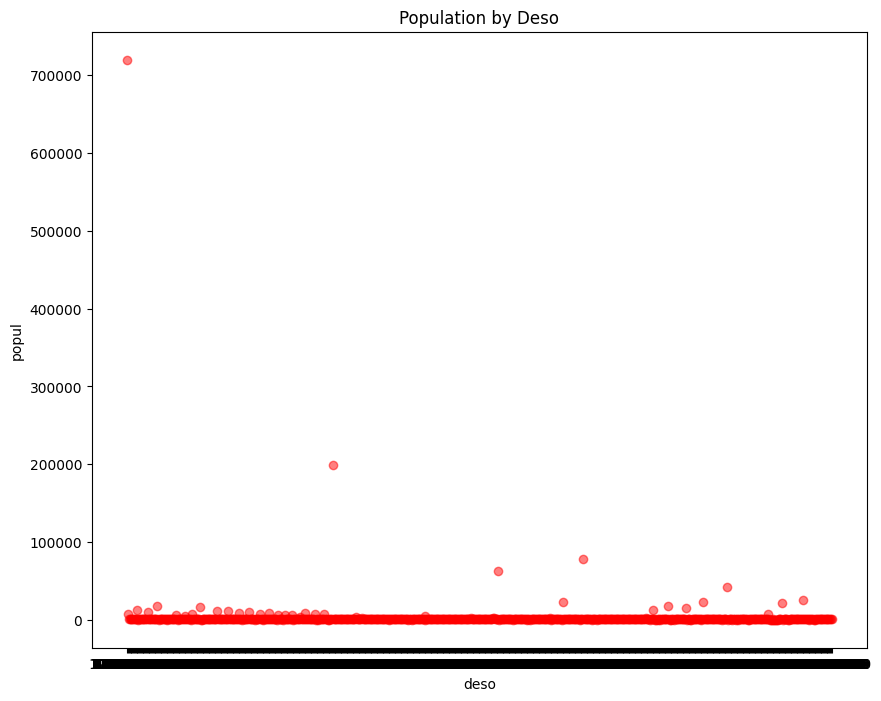

In [99]:
# Plot  values in scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(popul['deso'], popul['popul'], color='red', alpha=0.5)

# Set labels and title
plt.xlabel('deso')
plt.ylabel('popul')
plt.title('Population by Deso')

# Show the plot
plt.show()

In [100]:
skane_deso.head()

,uuid,deso,kommun,lan,kommunnamn,lannamn,version,geometry,bilar
0,{8DE2583C-6A92-45B5-AD41-7F40B7A90862},1256B2010,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((442392.479 6229549.453, 442336.506 6...",972
1,{5AF0864D-40F8-4599-8AA6-636D82976DB3},1292A0010,1292,12,Ängelholm,Skåne,2018_v2,"POLYGON ((362874.833 6230834.202, 363017.173 6...",570
2,{502B37EF-F99E-49FA-8AE9-689977ADBA90},1293A0030,1293,12,Hässleholm,Skåne,2018_v2,"POLYGON ((428549.363 6229473.419, 428688.223 6...",963
3,{06D3946E-BF4F-4250-ABFB-59DEC7568808},1256B2020,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((445231.902 6229682.276, 445233.485 6...",709
4,{5893A554-E321-47E1-8314-1F66C8702354},1284C1060,1284,12,Höganäs,Skåne,2018_v2,"POLYGON ((348816.642 6230586.542, 349053.743 6...",1070


In [101]:
skane_deso = skane_deso.merge(popul[['deso', 'popul']], on='deso', how='left')

# Display the merged DataFrame
skane_deso.head()

,uuid,deso,kommun,lan,kommunnamn,lannamn,version,geometry,bilar,popul
0,{8DE2583C-6A92-45B5-AD41-7F40B7A90862},1256B2010,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((442392.479 6229549.453, 442336.506 6...",972,826
1,{5AF0864D-40F8-4599-8AA6-636D82976DB3},1292A0010,1292,12,Ängelholm,Skåne,2018_v2,"POLYGON ((362874.833 6230834.202, 363017.173 6...",570,496
2,{502B37EF-F99E-49FA-8AE9-689977ADBA90},1293A0030,1293,12,Hässleholm,Skåne,2018_v2,"POLYGON ((428549.363 6229473.419, 428688.223 6...",963,812
3,{06D3946E-BF4F-4250-ABFB-59DEC7568808},1256B2020,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((445231.902 6229682.276, 445233.485 6...",709,759
4,{5893A554-E321-47E1-8314-1F66C8702354},1284C1060,1284,12,Höganäs,Skåne,2018_v2,"POLYGON ((348816.642 6230586.542, 349053.743 6...",1070,1056


In [102]:
# Create the 'car_owner_rate' column by dividing 'bilar' by 'popul'
skane_deso['car_owner_rate'] = skane_deso['bilar'] / skane_deso['popul']

# Output DataFrame
skane_deso.head()


,uuid,deso,kommun,lan,kommunnamn,lannamn,version,geometry,bilar,popul,car_owner_rate
0,{8DE2583C-6A92-45B5-AD41-7F40B7A90862},1256B2010,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((442392.479 6229549.453, 442336.506 6...",972,826,1.176755
1,{5AF0864D-40F8-4599-8AA6-636D82976DB3},1292A0010,1292,12,Ängelholm,Skåne,2018_v2,"POLYGON ((362874.833 6230834.202, 363017.173 6...",570,496,1.149194
2,{502B37EF-F99E-49FA-8AE9-689977ADBA90},1293A0030,1293,12,Hässleholm,Skåne,2018_v2,"POLYGON ((428549.363 6229473.419, 428688.223 6...",963,812,1.185961
3,{06D3946E-BF4F-4250-ABFB-59DEC7568808},1256B2020,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((445231.902 6229682.276, 445233.485 6...",709,759,0.934124
4,{5893A554-E321-47E1-8314-1F66C8702354},1284C1060,1284,12,Höganäs,Skåne,2018_v2,"POLYGON ((348816.642 6230586.542, 349053.743 6...",1070,1056,1.013258


In [103]:
skane_deso_gdf = gpd.GeoDataFrame(skane_deso, geometry='geometry')
skane_deso_gdf.head()

,uuid,deso,kommun,lan,kommunnamn,lannamn,version,geometry,bilar,popul,car_owner_rate
0,{8DE2583C-6A92-45B5-AD41-7F40B7A90862},1256B2010,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((442392.479 6229549.453, 442336.506 6...",972,826,1.176755
1,{5AF0864D-40F8-4599-8AA6-636D82976DB3},1292A0010,1292,12,Ängelholm,Skåne,2018_v2,"POLYGON ((362874.833 6230834.202, 363017.173 6...",570,496,1.149194
2,{502B37EF-F99E-49FA-8AE9-689977ADBA90},1293A0030,1293,12,Hässleholm,Skåne,2018_v2,"POLYGON ((428549.363 6229473.419, 428688.223 6...",963,812,1.185961
3,{06D3946E-BF4F-4250-ABFB-59DEC7568808},1256B2020,1256,12,Östra Göinge,Skåne,2018_v2,"POLYGON ((445231.902 6229682.276, 445233.485 6...",709,759,0.934124
4,{5893A554-E321-47E1-8314-1F66C8702354},1284C1060,1284,12,Höganäs,Skåne,2018_v2,"POLYGON ((348816.642 6230586.542, 349053.743 6...",1070,1056,1.013258


In [104]:
skane_deso_gdf.dtypes

uuid                object
deso                object
kommun              object
lan                 object
kommunnamn          object
lannamn             object
version             object
geometry          geometry
bilar                int64
popul                int32
car_owner_rate     float64
dtype: object

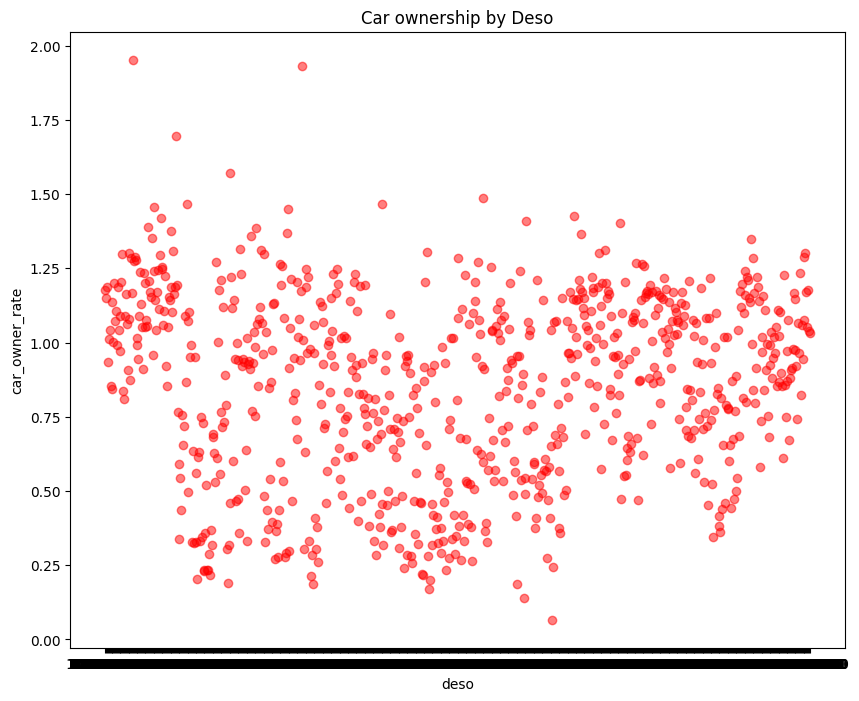

In [105]:
# Plot  values in scatterplot
plt.figure(figsize=(10, 8))
plt.scatter(skane_deso['deso'], skane_deso['car_owner_rate'], color='red', alpha=0.5)

# Set labels and title
plt.xlabel('deso')
plt.ylabel('car_owner_rate')
plt.title('Car ownership by Deso')

# Show the plot
plt.show()

C:\Users\ilts\AppData\Local\Temp\ipykernel_7824\1596294364.py:19: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  skane_deso_gdf.plot(ax=ax, column='car_owner_rate',  color=skane_deso_gdf['color'], legend=True, edgecolor='grey', linewidth=0.5)


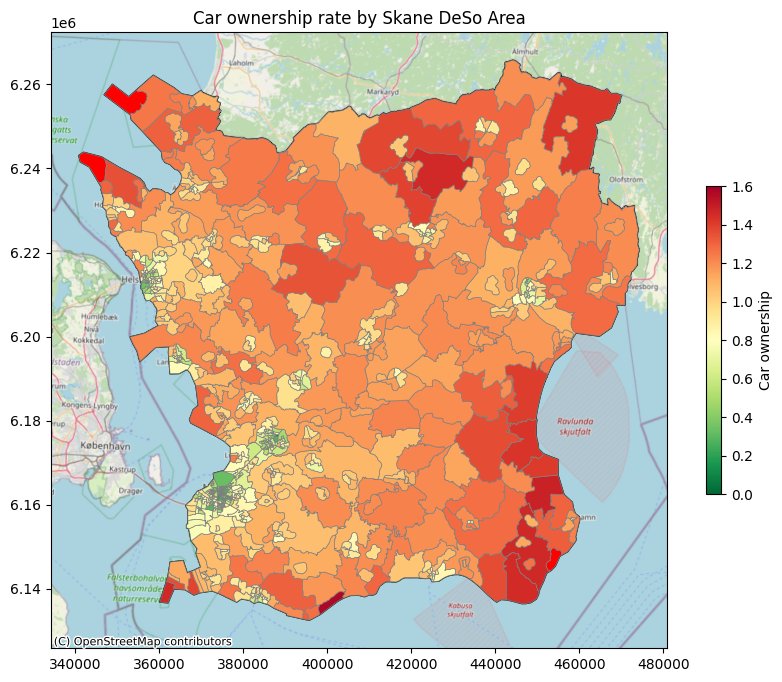

In [106]:
# Define color mapping function
def map_color(value):
    if pd.isnull(value) or value == 0:
        return 'darkgreen'
    elif value > 1.6:
        return 'red'
    else:
        return plt.cm.RdYlGn_r(value / 1.6)

# Create a new column 'color' using the color mapping function
skane_deso_gdf['color'] = skane_deso_gdf['car_owner_rate'].apply(map_color)
# Plot the map
fig, ax = plt.subplots(figsize=(10, 8))

# Plot Skane boundary
skane_boundary_gdf.plot(ax=ax, color='none', edgecolor='black')

# Plot Skane DeSo areas colored by car_owner_rate with reversed color map
skane_deso_gdf.plot(ax=ax, column='car_owner_rate',  color=skane_deso_gdf['color'], legend=True, edgecolor='grey', linewidth=0.5)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=skane_deso_gdf.crs, source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title
plt.title('Car ownership rate by Skane DeSo Area')

# Create a color bar for reference
sm = plt.cm.ScalarMappable(cmap='RdYlGn_r', norm=plt.Normalize(vmin=0, vmax=1.6))
sm._A = []
cbar = plt.colorbar(sm, orientation='vertical', ax=ax, shrink=0.5)
cbar.set_label('Car ownership')


# Show the plot
plt.show()

C:\Users\ilts\AppData\Roaming\Python\Python312\site-packages\IPython\core\interactiveshell.py:3517: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


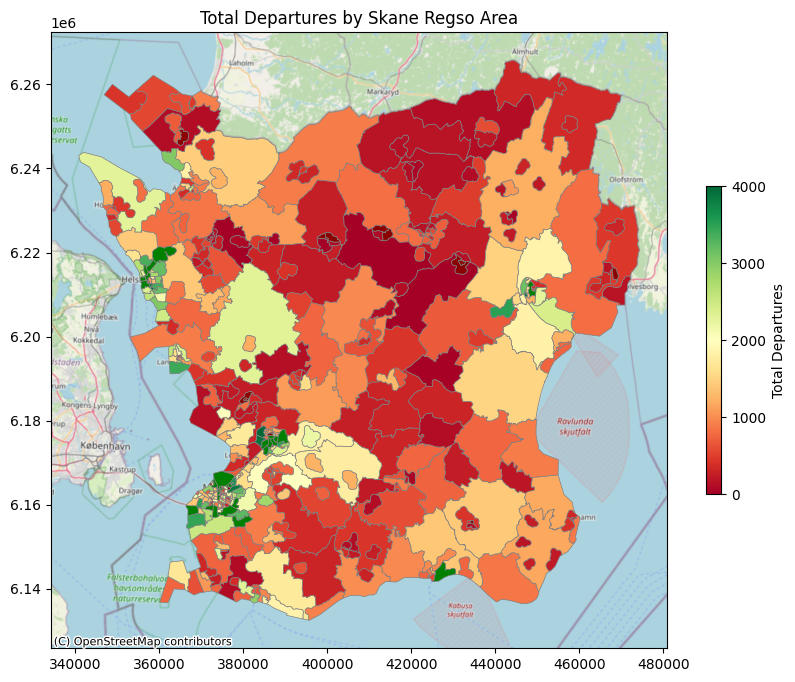

In [107]:
# Define color mapping function
def map_color(value):
    if pd.isnull(value) or value == 0:
        return 'darkred'
    elif value > 4000:
        return 'green'
    else:
        return plt.cm.RdYlGn(value / 4000)

# Perform spatial join
joined_data = gpd.sjoin(gdf_stops, skane_regso, op='within')

# Aggregate n_departures by skane_regso area
agg_data = joined_data.groupby('regsokod')['n_departures'].sum().reset_index()

# Merge aggregated data back to skane_regso
skane_regso_with_agg = skane_regso.merge(agg_data, left_on='regsokod', right_on='regsokod', how='left')

# Create a new column 'color' using the color mapping function
skane_regso_with_agg['color'] = skane_regso_with_agg['n_departures'].apply(map_color)

# Plot the map
fig, ax = plt.subplots(figsize=(10, 8))
skane_regso_with_agg.plot(ax=ax, color=skane_regso_with_agg['color'], edgecolor='grey', linewidth=0.5)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=skane_regso_with_agg.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Set plot title
plt.title('Total Departures by Skane Regso Area')

# Create a color bar for reference
sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=0, vmax=4000))
sm._A = []
cbar = plt.colorbar(sm, orientation='vertical', ax=ax, shrink=0.5)
cbar.set_label('Total Departures')
cbar.set_ticks([0, 1000, 2000, 3000, 4000])

# Show the plot
plt.show()

## Assigning filtered stops to routes in Stockholm 

In [278]:
# Read trips.txt from the specified file path
trips_sl = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\sl\trips.txt')

# Load shapes.txt data into a DataFrame named 'shapes'
shapes_sl = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\sl\shapes.txt')

stop_times_sl = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\sl\stop_times.txt')

stops_sl = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\sl\stops.txt')

routes_sl = pd.read_csv(r'C:\Users\ilts\Documents\TraffikLab\sl\routes.txt')

In [279]:
routes_sl.head()

,route_id,agency_id,route_short_name,route_long_name,route_type,route_desc
0,9011001000100000,14010000000001001,1,NaN,700,blåbuss
1,9011001000200000,14010000000001001,2,NaN,700,blåbuss
2,9011001000300000,14010000000001001,3,NaN,700,blåbuss
3,9011001000400000,14010000000001001,4,NaN,700,blåbuss
4,9011001001000000,14010000000001001,10,Blå linjen,401,tunnelbanans blå linje


In [280]:
routes_sl.dtypes

route_id            object
agency_id            int64
route_short_name    object
route_long_name     object
route_type           int64
route_desc          object
dtype: object

In [281]:
# Define the filtered route short names as strings
filtered_route_short_names = ['91','93','94','96','199','291','293','396','491','496','497','590','591','592','593','597','598','690','691','694','695','697','791','795','796','797','798','890','892','893','117','119','133','134','142','147',
'160','165','175','188','515', '601','144','610','828','831']

# Filter the routes DataFrame based on route_short_name
filtered_routes = routes_sl[routes_sl['route_short_name'].isin(filtered_route_short_names)]

filtered_routes.head()


,route_id,agency_id,route_short_name,route_long_name,route_type,route_desc
32,9011001009100000,14010000000001001,91,NaN,700,NaN
33,9011001009400000,14010000000001001,94,NaN,700,NaN
34,9011001009600000,14010000000001001,96,NaN,700,NaN
40,9011001011700000,14010000000001001,117,NaN,700,NaN
42,9011001011900000,14010000000001001,119,NaN,700,NaN


In [282]:
# Filter the routes dataframe based on route_short_name
filtered_routes = routes_sl[routes_sl['route_short_name'].isin(filtered_route_short_names)]

# Count the occurrences of each route_short_name
route_short_name_counts = filtered_routes['route_short_name'].value_counts()

# Display the counts
print(route_short_name_counts)


route_short_name
91     1
797    1
601    1
610    1
690    1
691    1
694    1
695    1
697    1
791    1
795    1
798    1
94     1
828    1
831    1
890    1
892    1
893    1
593    1
93     1
796    1
590    1
598    1
597    1
592    1
591    1
96     1
117    1
119    1
133    1
134    1
142    1
144    1
147    1
160    1
165    1
188    1
199    1
291    1
293    1
396    1
491    1
496    1
497    1
515    1
175    1
Name: count, dtype: int64


In [283]:
# Merge the filtered routes dataframe with the trips dataframe
merged_routes_trips = pd.merge(filtered_routes, trips_sl, on='route_id', how='inner')

# Merge the resulting dataframe with the stop_times dataframe
merged_trips_stop_times = pd.merge(merged_routes_trips, stop_times_sl, on='trip_id', how='inner')

In [284]:
merged_trips_stop_times.head()

,route_id,agency_id,route_short_name,route_long_name,route_type,route_desc,service_id,trip_id,trip_headsign,direction_id,shape_id,arrival_time,departure_time,stop_id,stop_sequence,stop_headsign,pickup_type,drop_off_type,shape_dist_traveled,timepoint
0,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,1014010000486740147,24:50:00,24:50:00,9022001010028003,1,Stora Essingen,3,1,0.00,1
1,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,1014010000486740147,24:50:56,24:50:56,9022001010052003,2,Stora Essingen,3,3,398.26,0
2,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,1014010000486740147,24:51:22,24:51:22,9022001010054002,3,Stora Essingen,3,3,570.67,0
3,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,1014010000486740147,24:51:57,24:51:57,9022001010056002,4,Stora Essingen,3,3,808.54,0
4,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,1014010000486740147,24:52:45,24:52:45,9022001010058002,5,Stora Essingen,3,3,1107.90,0


In [285]:
# Merge the dataframe obtained above with the stops dataframe
merged_stops_data = pd.merge(merged_trips_stop_times, stops_sl, on='stop_id', how='inner')

# Display the resulting dataframe
print(merged_stops_data)

                route_id          agency_id route_short_name route_long_name  \
0       9011001009100000  14010000000001001               91             NaN   
1       9011001009100000  14010000000001001               91             NaN   
2       9011001009100000  14010000000001001               91             NaN   
3       9011001009100000  14010000000001001               91             NaN   
4       9011001009100000  14010000000001001               91             NaN   
...                  ...                ...              ...             ...   
158782  9011001017500000  14010000000001001              175             NaN   
158783  9011001017500000  14010000000001001              175             NaN   
158784  9011001017500000  14010000000001001              175             NaN   
158785  9011001017500000  14010000000001001              175             NaN   
158786  9011001017500000  14010000000001001              175             NaN   

        route_type route_desc  service_

In [286]:
merged_stops_data.head()

,route_id,agency_id,route_short_name,route_long_name,route_type,route_desc,service_id,trip_id,trip_headsign,direction_id,...,pickup_type,drop_off_type,shape_dist_traveled,timepoint,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code
0,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,...,3,1,0.00,1,Frihamnen,59.341873,18.118316,0,9.021001e+15,NaN
1,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,...,3,3,398.26,0,Frihamnsporten,59.341138,18.113897,0,9.021001e+15,NaN
2,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,...,3,3,570.67,0,Sehlstedtsgatan,59.342237,18.112643,0,9.021001e+15,NaN
3,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,...,3,3,808.54,0,Östhammarsgatan,59.342950,18.110593,0,9.021001e+15,NaN
4,9011001009100000,14010000000001001,91,NaN,700,NaN,5,14010000592231511,NaN,1,...,3,3,1107.90,0,Rökubbsgatan,59.345483,18.108934,0,9.021001e+15,NaN


In [294]:
# Save merged_stops_data as a CSV file
merged_stops_data.to_csv('merged_stops_data_07_05.csv', index=False)

#### Plotting to check result

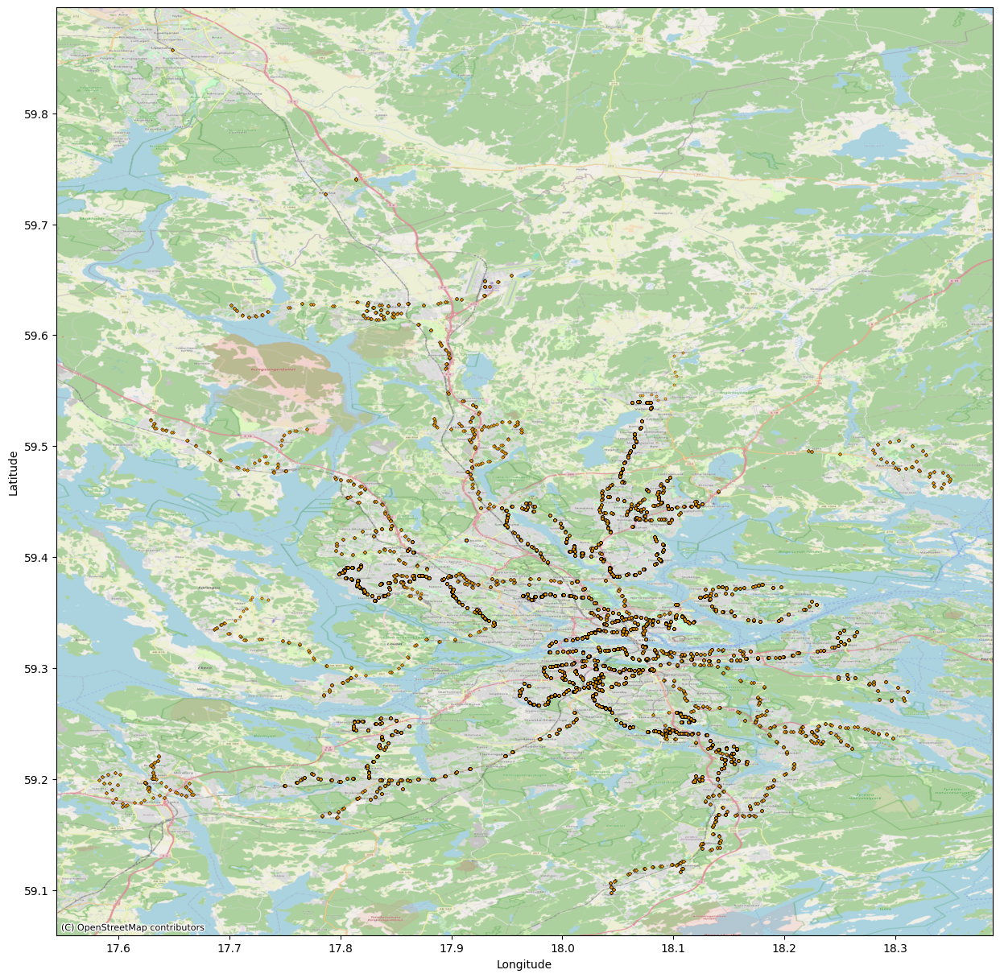

In [302]:
# Convert DataFrame to GeoDataFrame
gdf_merged_stops_data = gpd.GeoDataFrame(merged_stops_data, geometry=gpd.points_from_xy(merged_stops_data['stop_lon'], merged_stops_data['stop_lat']))

# Set CRS of the GeoDataFrame
gdf_merged_stops_data.crs = CRS.from_epsg(4326)  # Assuming the original CRS is EPSG:4326 (WGS84)

# Plot the bus stops on the map
fig, ax = plt.subplots(figsize=(15, 15))
gdf_merged_stops_data.plot(ax=ax, color='orange', edgecolor='black', linewidth=0.3, markersize=5, alpha=0.5)

# Add basemap from OpenStreetMap using contextily
ctx.add_basemap(ax, crs=gdf_merged_stops_data.crs, source=ctx.providers.OpenStreetMap.Mapnik, zoom=12)

# Set axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

## Accessibility analysis

In [3]:
gdf_stops_within_skane.tail()

NameError: name 'gdf_stops_within_skane' is not defined

In [248]:
print(dir(ox))

['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', '_api', '_downloader', '_errors', '_nominatim', '_overpass', '_version', 'add_edge_bearings', 'add_edge_grades', 'add_edge_speeds', 'add_edge_travel_times', 'add_node_elevations_google', 'add_node_elevations_raster', 'basic_stats', 'bearing', 'citation', 'config', 'consolidate_intersections', 'convert', 'distance', 'elevation', 'features', 'features_from_address', 'features_from_bbox', 'features_from_place', 'features_from_point', 'features_from_polygon', 'features_from_xml', 'folium', 'geocode', 'geocode_to_gdf', 'geocoder', 'geometries', 'geometries_from_address', 'geometries_from_bbox', 'geometries_from_place', 'geometries_from_point', 'geometries_from_polygon', 'geometries_from_xml', 'get_digraph', 'get_undirected', 'graph', 'graph_from_address', 'graph_from_bbox', 'graph_from_gdfs', 'graph_from_place', 'graph_from_point', 'graph_from_polygon', 'grap

In [249]:
print(gdf_stops_within_skane.crs)
print(skane_boundary_gdf.crs)

EPSG:3006
EPSG:3006


In [307]:
rows_with_malmo = gdf_stops_within_skane[gdf_stops_within_skane['stop_name'].str.contains('Malmö C')]
rows_with_malmo = rows_with_malmo.to_crs('EPSG:3006')

rows_with_malmo.tail(30)


,stop_id,stop_name,stop_lat,stop_lon,location_type,parent_station,platform_code,n_departures,avg_headway,dep_labels,geometry,color
5722,9022012080000022,Malmö C,55.609412,13.002456,0,9.021012e+15,8b,0.0,NaN,Low,POINT (374173.230 6164419.893),red
5723,9022012080000023,Malmö C,55.609180,13.001727,0,9.021012e+15,10,8.0,367.500000,Low,POINT (374126.574 6164395.401),red
5724,9022012080000024,Malmö C,55.609341,13.002493,0,9.021012e+15,9b,0.0,NaN,Low,POINT (374175.333 6164411.926),red
5725,9022012080000025,Malmö C,55.609803,12.999920,0,9.021012e+15,1,0.0,NaN,Low,POINT (374014.763 6164467.998),red
5726,9022012080000026,Malmö C,55.609724,12.999973,0,9.021012e+15,2,0.0,NaN,Low,POINT (374017.848 6164459.112),red
5727,9022012080000027,Malmö C,55.609591,13.000046,0,9.021012e+15,4,0.0,NaN,Low,POINT (374022.019 6164444.181),red
5728,9022012080000028,Malmö C,55.611112,13.000176,0,9.021012e+15,P,0.0,NaN,Low,POINT (374035.083 6164613.180),red
5729,9022012080000029,Malmö C,55.609653,13.000010,0,9.021012e+15,3,0.0,NaN,Low,POINT (374019.950 6164451.145),red
5730,9022012080000041,Malmö C,55.609854,13.000186,0,9.021012e+15,1a,0.0,NaN,Low,POINT (374031.680 6164473.190),red
5731,9022012080000042,Malmö C,55.609765,13.000224,0,9.021012e+15,2a,28.0,120.000000,Medium,POINT (374033.787 6164463.218),orange


### Walking

In [154]:
# Configure the place, network type, trip times, and travel speed
stop = (55.611804,	13.000968)
network_type = 'walk'
trip_times = [5, 10, 15, 20, 25]  # in minutes
travel_speed = 4.0  # walking speed in km/hour      

# Retrieve the street network graph
G = ox.graph_from_point(stop, network_type=network_type, dist=1500)  # Adjust distance for a larger area
G_proj = ox.project_graph(G)


In [155]:
# Add an edge attribute for time in minutes required to traverse each edge
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for u, v, k, data in G_proj.edges(data=True, keys=True):
    data['time'] = data['length'] / meters_per_minute

#### Checking the position of the Malmo C stop

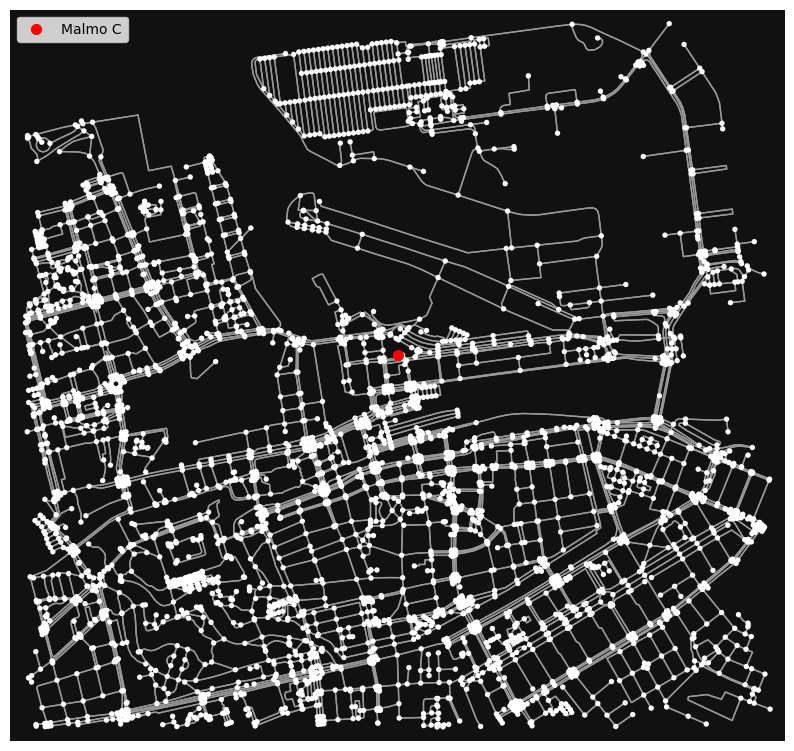

In [156]:
# Plot the street network graph with the stop
fig, ax = ox.plot_graph(G, show=False, close=False, figsize=(10, 10))

# Plot the stop on the graph
ax.scatter(stop[1], stop[0], color='red', s=50, label='Malmo C')

# Add legend
ax.legend()

# Show the plot
plt.show()

#### Checking center node position

In [157]:
# Convert the stop coordinates to a Shapely Point object
stop_point = Point(stop)

# Convert the stop point to a GeoDataFrame with the same CRS as the projected graph
stop_gdf = gpd.GeoDataFrame(geometry=[stop_point], crs=G_proj.graph['crs'])

# Print the GeoDataFrame and its CRS
print(stop_gdf)
print(stop_gdf.crs)

                geometry
0  POINT (55.612 13.001)
EPSG:32633


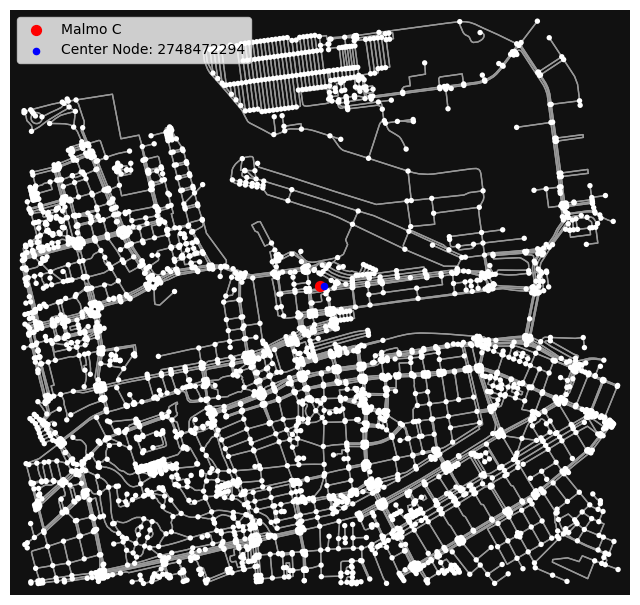

In [158]:
# Find the nearest node to the stop based on the Euclidean distance
center_node = ox.distance.nearest_nodes(G, stop[1], stop[0], return_dist=False)

# Plot the street network graph with the stop
fig, ax = ox.plot_graph(G, show=False, close=False)

# Plot the stop on the graph
ax.scatter(stop[1], stop[0], color='red', s=50, label='Malmo C')

# Highlight the nearest node
center_node_x, center_node_y = G.nodes[center_node]['x'], G.nodes[center_node]['y']
center_node_label = f'Center Node: {center_node}'
ax.scatter(center_node_x, center_node_y, color='blue', s=20, label=center_node_label)

# Add legend
ax.legend()

# Show the plot
plt.show()

In [50]:
# # Define the coordinates of the stop
# stop = (55.611747, 13.002004)

# # Retrieve the street network graph
# G = ox.graph_from_point(stop, dist=1000, network_type='walk')

# # Find the nearest node to the stop based on the Euclidean distance
# nearest_node = ox.distance.nearest_nodes(G, stop[1], stop[0], return_dist=False)

# # Calculate the Euclidean distance from the stop to the nearest node
# nearest_node_coords = (G.nodes[nearest_node]['y'], G.nodes[nearest_node]['x'])
# euclidean_distance = euclidean(stop, nearest_node_coords)

# print("Distance to nearest node:", euclidean_distance)


Distance to nearest node: 7.997580884225429e-05


In [159]:
print(stop_gdf.crs)
print(G_proj.graph['crs'])

EPSG:32633
EPSG:32633


#### Making isochrones

In [160]:
# Make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G_proj, center_node, radius=trip_time, distance='time')
    node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = unary_union(node_points).convex_hull
    isochrone_polys.append(bounding_poly)

C:\Users\ilts\AppData\Local\Temp\ipykernel_26744\627464580.py:2: FutureWarning: The `return_hex` parameter has been deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)


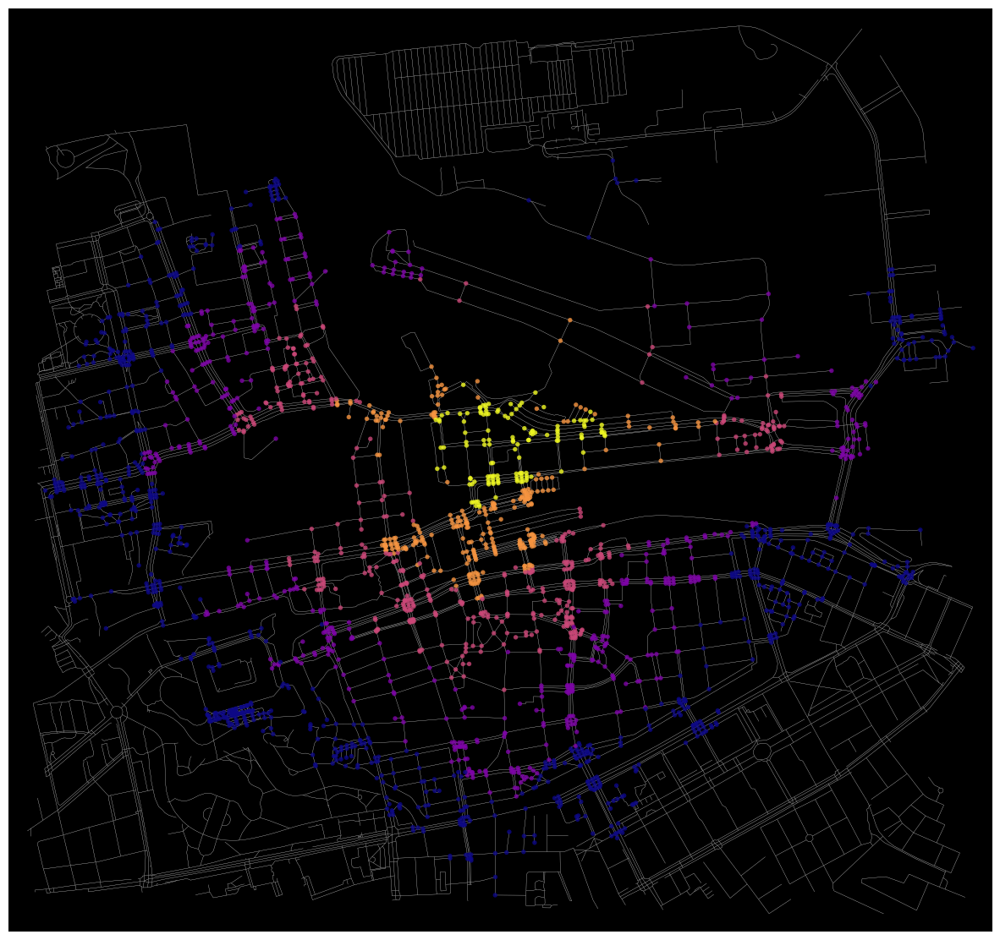

In [161]:
# Get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)

# Color the nodes according to isochrone then plot the street network
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G_proj, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color

nc = [node_colors.get(node, 'none') for node in G_proj.nodes()]
ns = [15 if node in node_colors else 0 for node in G_proj.nodes()]

# Plot the street network with node colors
fig, ax = ox.plot_graph(G_proj, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2,
                        bgcolor='k', edge_linewidth=0.2, edge_color='#999999', show=False, figsize=(15, 15))


C:\Users\ilts\AppData\Local\Temp\ipykernel_26744\3257984706.py:2: FutureWarning: The `return_hex` parameter has been deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)


Polygon: POLYGON ((374051.3815054045 6163227.106319835, 373140.15066112485 6163781.795844402, 372710.784014969 6164164.721622782, 372704.04127245175 6164171.733128909, 372616.2967534271 6164519.15810142, 372723.5601297947 6164916.79454301, 372747.50909331575 6164993.592366304, 372966.15430375375 6165376.277395401, 373351.0471090021 6165513.882341276, 374426.71033961524 6165572.173260183, 375318.30004458234 6165224.790089119, 375470.9244143367 6165097.178115264, 375575.7529530474 6164973.749476299, 375379.3439129498 6164239.925629972, 375361.5581131771 6164222.9941892335, 374440.62637935823 6163409.19729689, 374051.3815054045 6163227.106319835))
Exterior: LINEARRING (374051.3815054045 6163227.106319835, 373140.15066112485 6163781.795844402, 372710.784014969 6164164.721622782, 372704.04127245175 6164171.733128909, 372616.2967534271 6164519.15810142, 372723.5601297947 6164916.79454301, 372747.50909331575 6164993.592366304, 372966.15430375375 6165376.277395401, 373351.0471090021 6165513.88

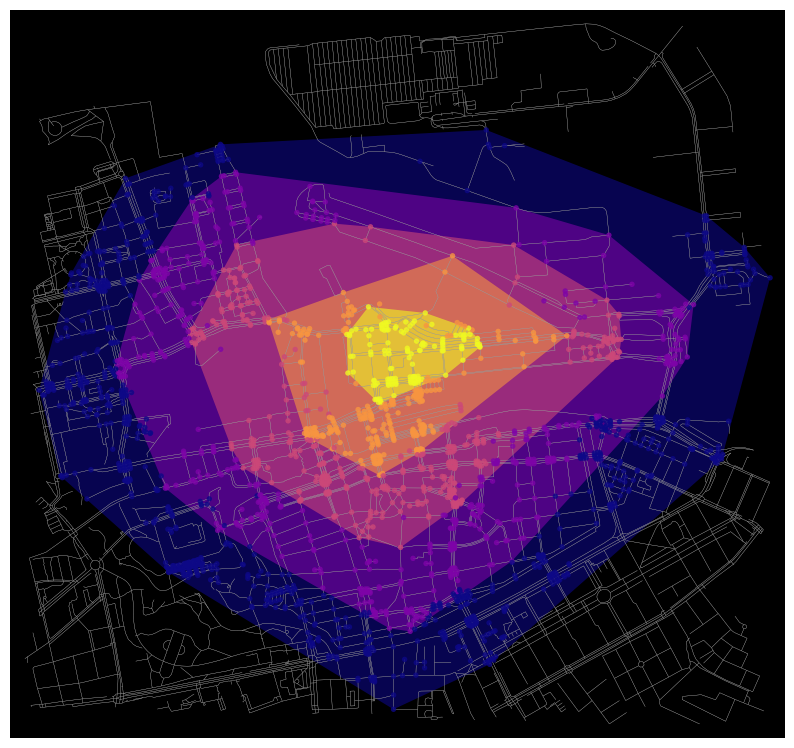

In [167]:
# Get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)

# Color the nodes according to isochrone then plot the street network
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G_proj, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color

nc = [node_colors.get(node, 'none') for node in G_proj.nodes()]
ns = [15 if node in node_colors else 0 for node in G_proj.nodes()]


fig, ax = ox.plot_graph(G_proj, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2,
                        bgcolor='k', edge_linewidth=0.2, edge_color='#999999', show=False, figsize=(10, 10))
# Make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G_proj, center_node, radius=trip_time, distance='time')
    node_points = [Point((G_proj.nodes[node]['x'], G_proj.nodes[node]['y'])) for node in subgraph.nodes()]
    bounding_poly = unary_union(node_points).convex_hull
    isochrone_polys.append(bounding_poly)

# Plot the isochrone polygons
for polygon, fc in zip(isochrone_polys, iso_colors):
    print("Polygon:", polygon)
    print("Exterior:", polygon.exterior)
    
    # Convert LinearRing to list of coordinates
    exterior_coords = list(polygon.exterior.coords)
    
    patch = Polygon(exterior_coords, fc=fc, ec='none', alpha=0.6, zorder=-1)
    ax.add_patch(patch)

#### Improving shapes

C:\Users\ilts\AppData\Local\Temp\ipykernel_26744\3130820879.py:2: FutureWarning: The `return_hex` parameter has been deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)


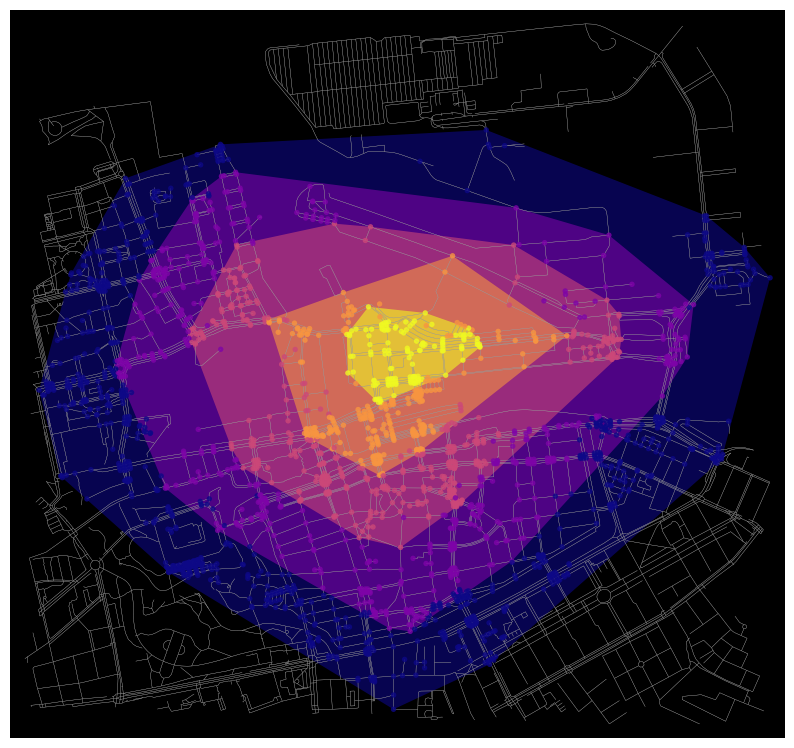

In [168]:
# Get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='plasma', start=0, return_hex=True)

# Color the nodes according to isochrone then plot the street network
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G_proj, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color

nc = [node_colors.get(node, 'none') for node in G_proj.nodes()]
ns = [15 if node in node_colors else 0 for node in G_proj.nodes()]

fig, ax = ox.plot_graph(G_proj, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2,
                        bgcolor='k', edge_linewidth=0.2, edge_color='#999999', show=False, figsize=(10, 10))

# Make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(G_proj, center_node, radius=trip_time, distance='time')
    node_points = [Point((G_proj.nodes[node]['x'], G_proj.nodes[node]['y'])) for node in subgraph.nodes()]
    
    # Densify the boundary by adding more vertices
    densified_points = [node_points[0]]
    for i in range(len(node_points) - 1):
        if node_points[i].distance(node_points[i+1]) > 50:  # Adjust the threshold as needed
            mid_point = Point((node_points[i].x + node_points[i+1].x) / 2, (node_points[i].y + node_points[i+1].y) / 2)
            densified_points.append(mid_point)
        densified_points.append(node_points[i+1])
    
    bounding_poly = unary_union(densified_points).convex_hull
    isochrone_polys.append(bounding_poly)

# Plot the isochrone polygons
for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = Polygon(polygon.exterior.coords, fc=fc, ec='none', alpha=0.6, zorder=-1)
    ax.add_patch(patch)

# Show the plot
plt.show()

In [151]:
# Find the nearest node to the stop based on the Euclidean distance
center_node = ox.distance.nearest_nodes(G, stop[1], stop[0], return_dist=False)

# Ensure that center_node is not an integer
print(type(center_node))

# Print the value of center_node for further inspection
print(center_node)

<class 'int'>
10116837661


## Working with bus lines 